# GUC Clustering Project 

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



In [1]:
# if plotnine is not installed in Jupter then use the following command to install it 
!pip install plotnine

Running this project require the following imports 

In [2]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score

%matplotlib inline

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
import seaborn as sns
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import pdist
from scipy.cluster import hierarchy
from sklearn.datasets import load_iris
from sklearn import datasets

In [3]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



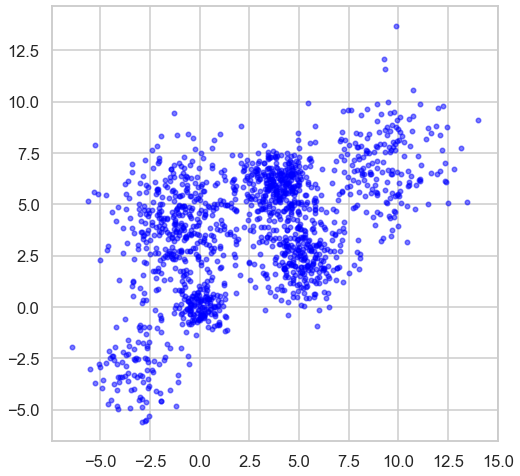

In [4]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

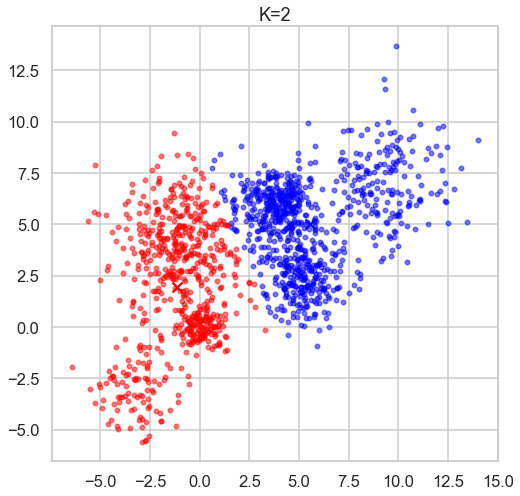

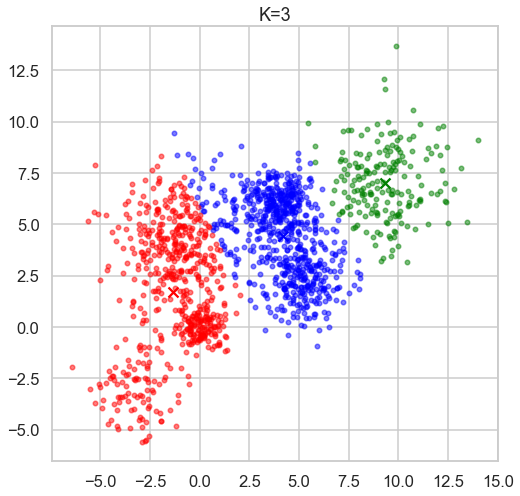

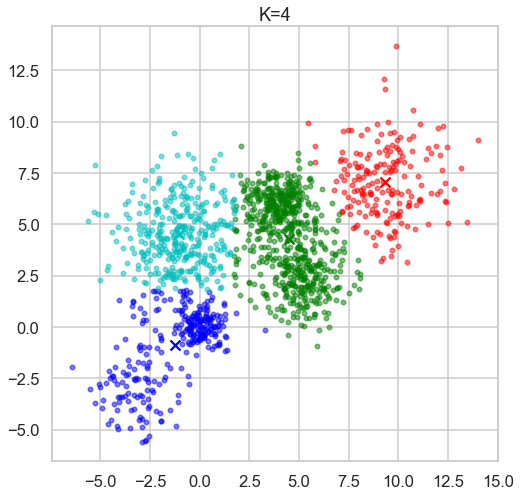

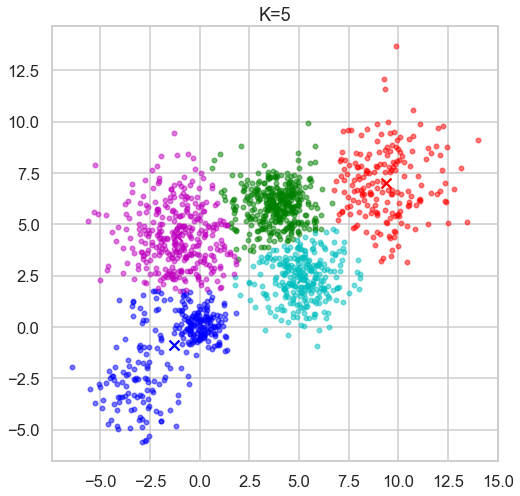

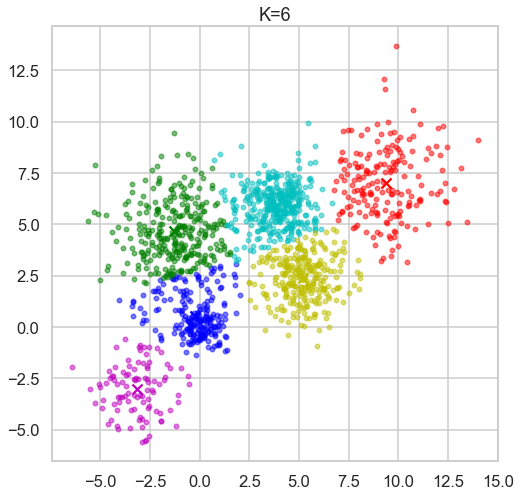

In [5]:
# Using kmeans clustering to cluster the data with different values of k and calculating distortion 
#and silhouette score for each value of k
Kvalues=range(2,7)
distortions=[]
silhouettes=[]
for K in Kvalues:
    KM=KMeans(n_clusters=K, random_state=42)
    KM.fit(Multi_blob_Data)
    distortions.append(KM.inertia_)
    silhouettes.append(silhouette_score(Multi_blob_Data, KM.labels_))
    plt.figure()
    display_cluster(Multi_blob_Data, KM, K)
    plt.title("K={}".format(K))
    plt.show()

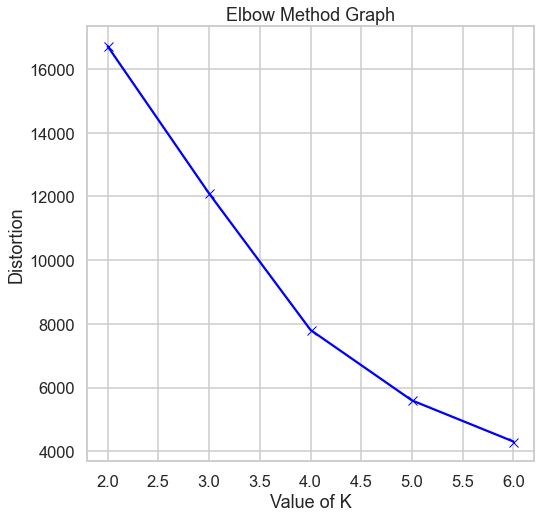

In [6]:
# plotting distortion score versus K
plt.figure()
plt.plot(Kvalues, distortions, 'bx-')
plt.xlabel('Value of K')
plt.ylabel('Distortion')
plt.title('Elbow Method Graph')
plt.show()

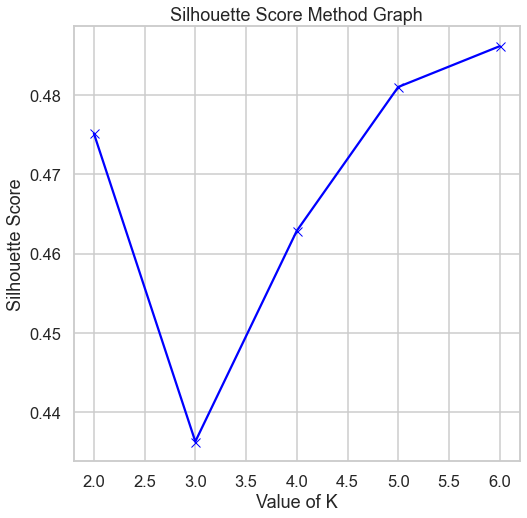

In [7]:
# plotting silhouette score versus K
plt.figure()
plt.plot(Kvalues, silhouettes, 'bx-')
plt.xlabel('Value of K')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score Method Graph')
plt.show()

In [8]:
# choosing the best value for K based on silhouette score 
BestK=np.argmax(silhouettes) + 2
print("Best value of K is : ", BestK)

Best value of K is :  6


### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

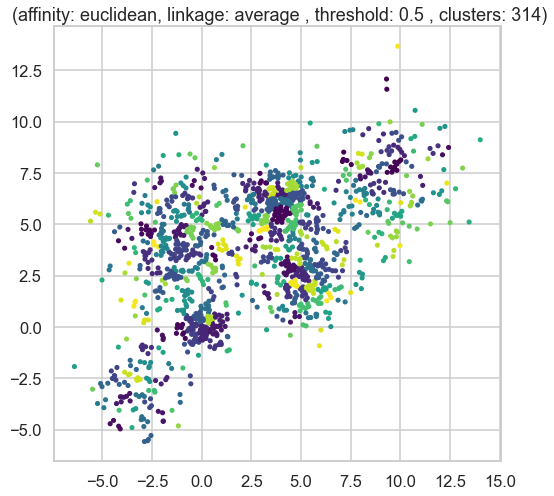

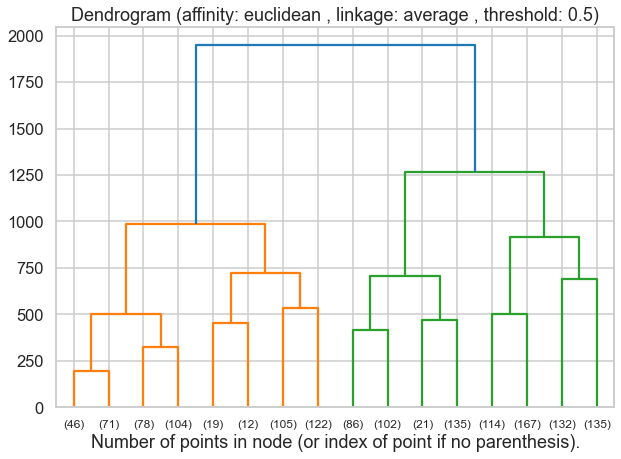

Silhouette score: 0.3743241305054584
Number of clusters: 314


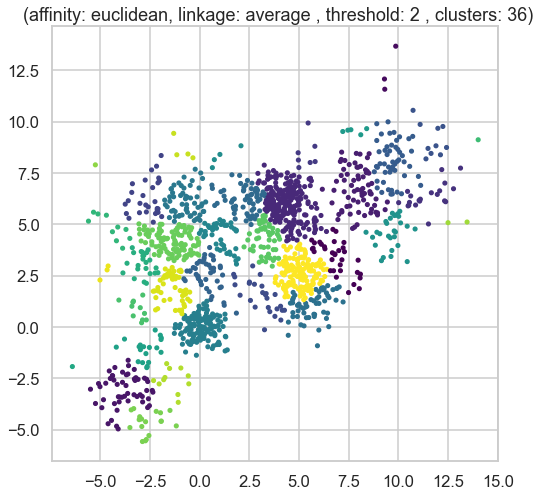

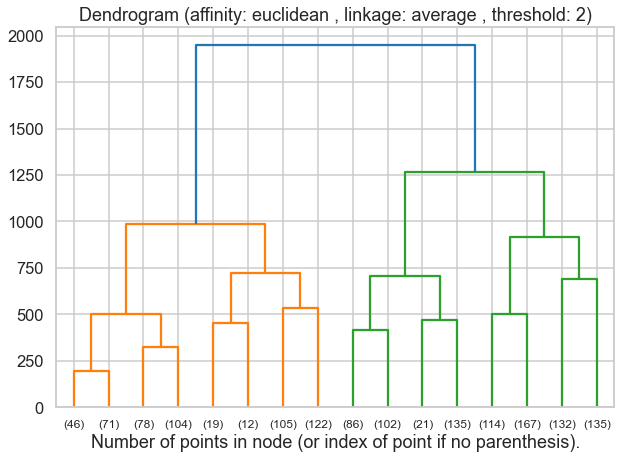

Silhouette score: 0.31557101720950825
Number of clusters: 36


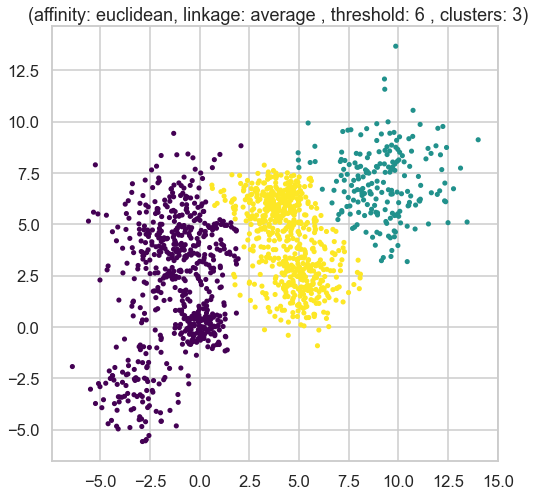

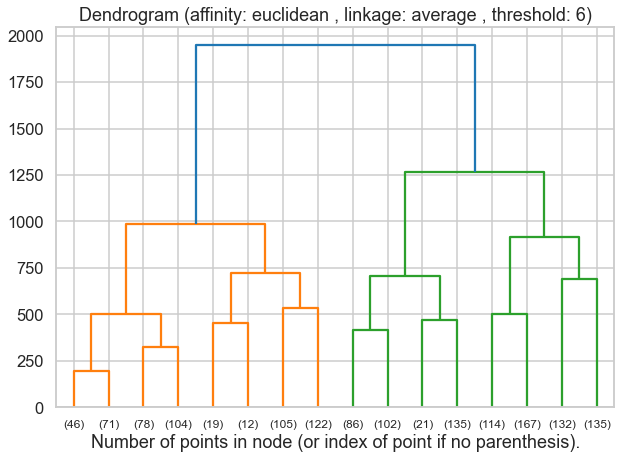

Silhouette score: 0.4307906732655957
Number of clusters: 3


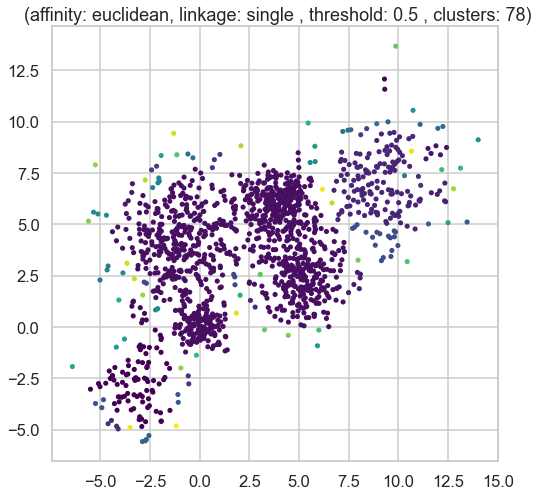

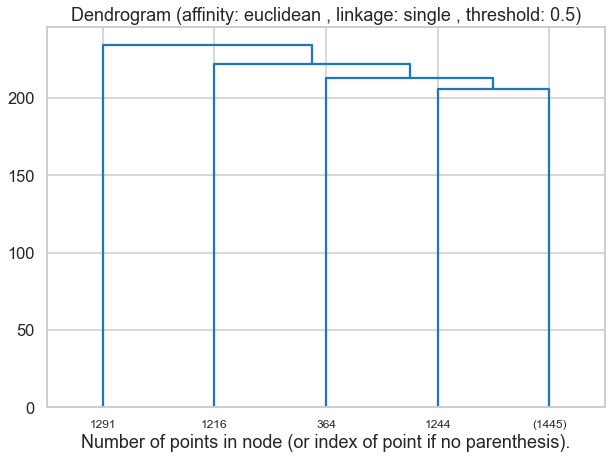

Silhouette score: -0.45965502592646973
Number of clusters: 78


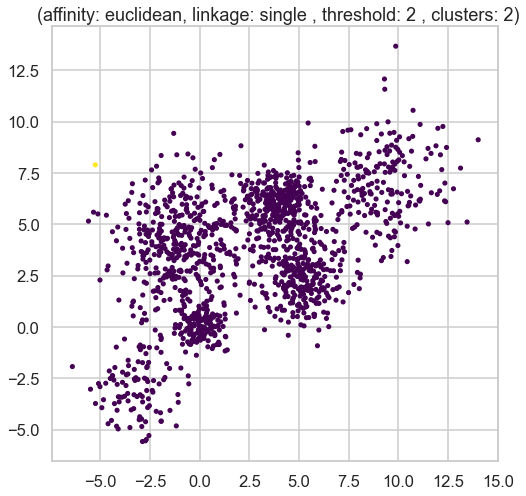

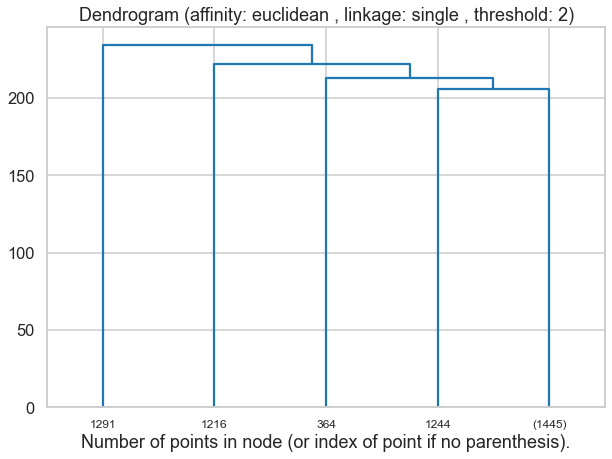

Silhouette score: 0.3218066204847175
Number of clusters: 2


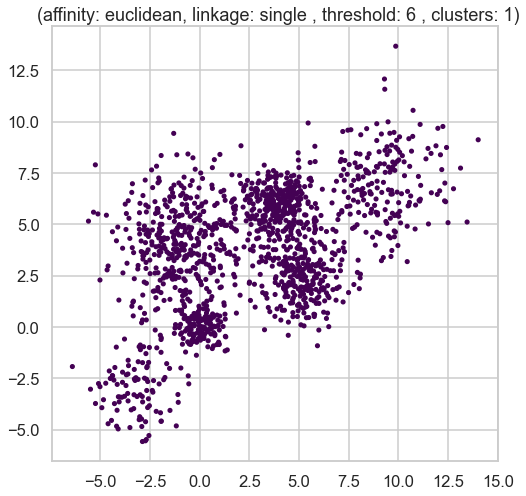

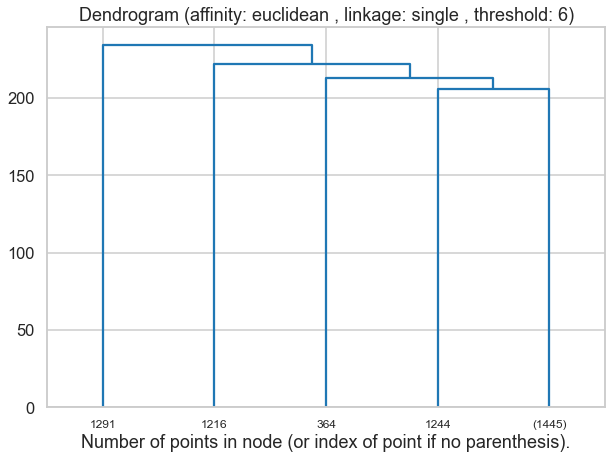

Silhouette score: 0.3218066204847175
Number of clusters: 1


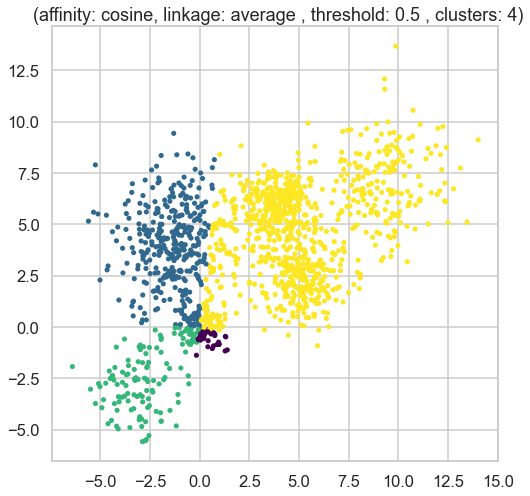

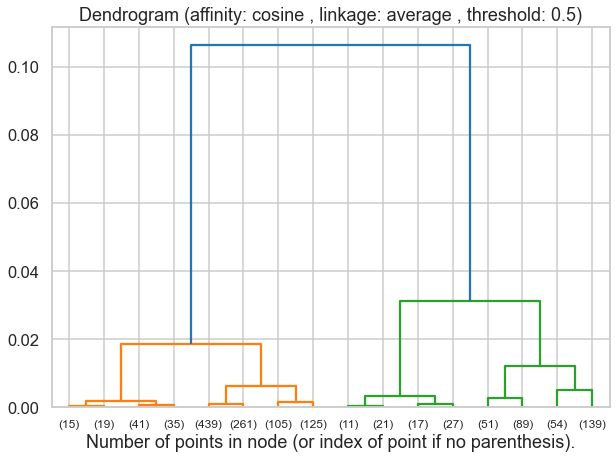

Silhouette score: 0.28022113778340446
Number of clusters: 4


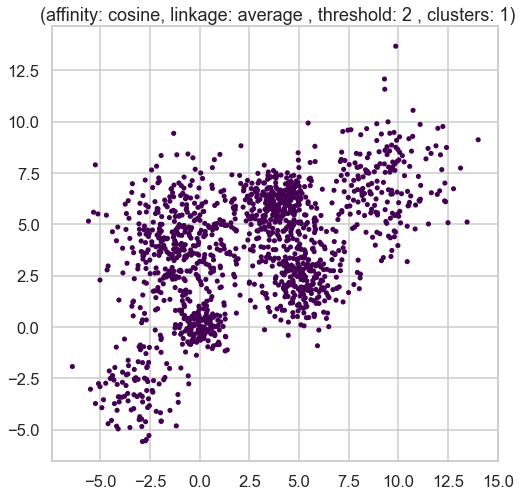

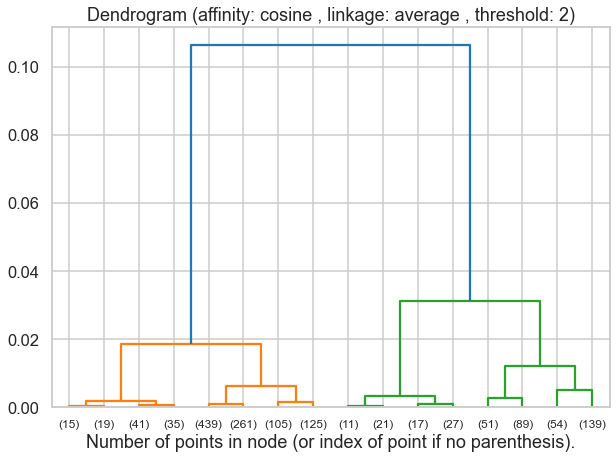

Silhouette score: 0.28022113778340446
Number of clusters: 1


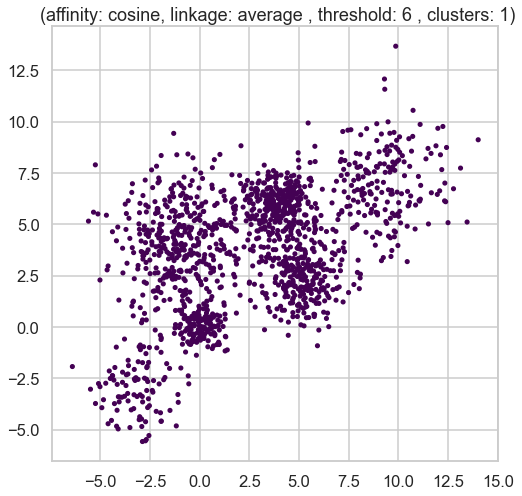

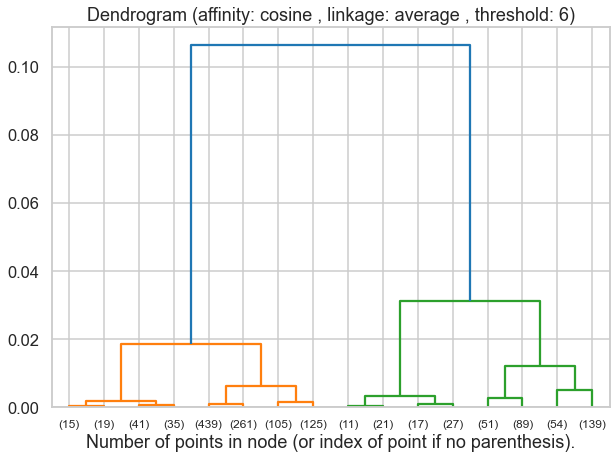

Silhouette score: 0.28022113778340446
Number of clusters: 1


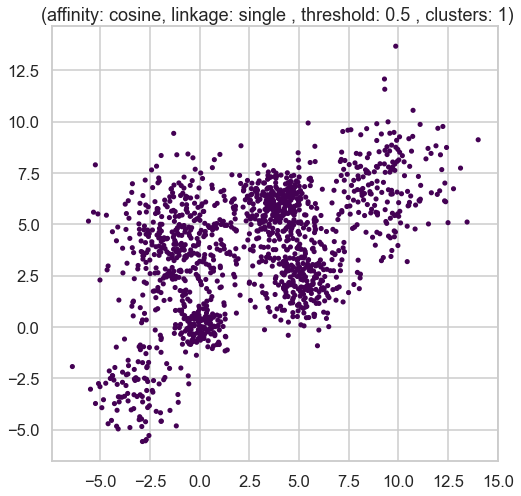

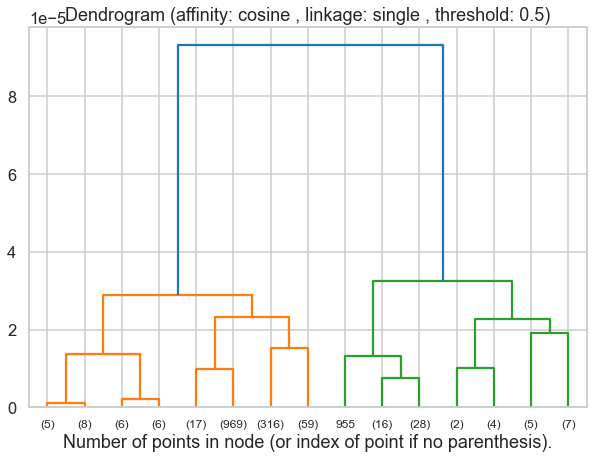

Silhouette score: 0.28022113778340446
Number of clusters: 1


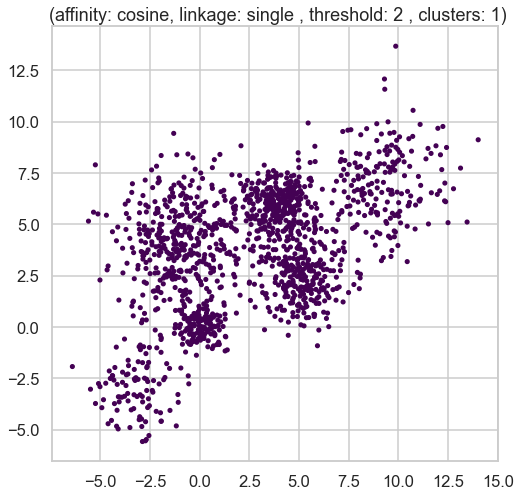

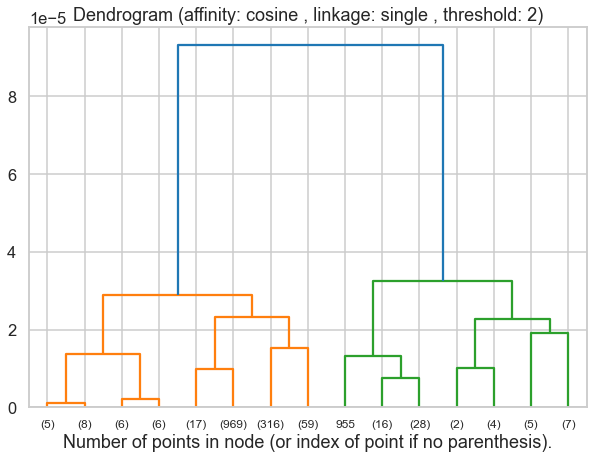

Silhouette score: 0.28022113778340446
Number of clusters: 1


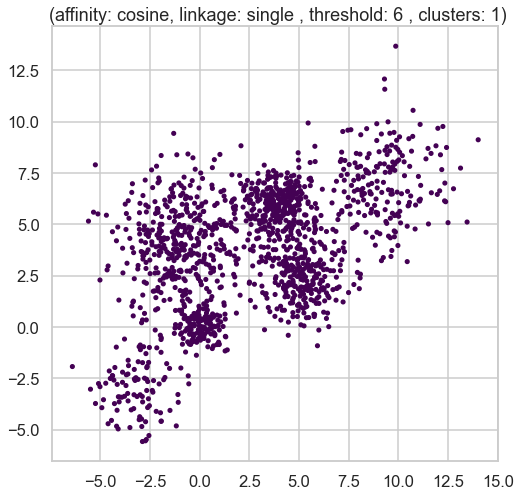

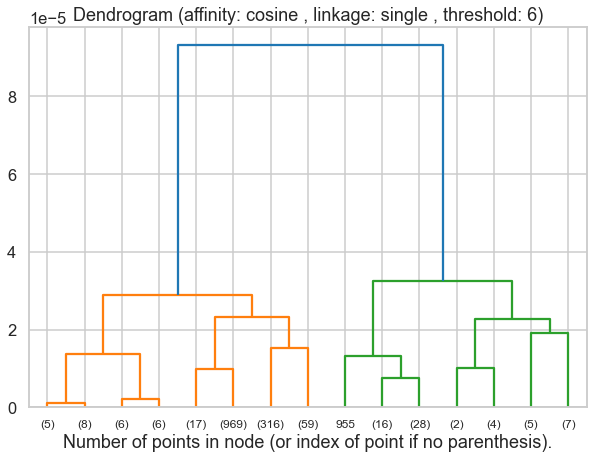

Silhouette score: 0.28022113778340446
Number of clusters: 1
Best Silhouette score: 0.4307906732655957
Number of clusters in best model: 3


In [9]:
#defining some parameters
NumOfClusters=[]
affinities=['euclidean', 'cosine']
linkages=['average', 'single']
thresholds=[0.5,2,6]
BestScore_HC=-1
BestModel_HC=None
#applying the technique using different combinations of the parameters
for affinity in affinities:
    for linkage_method in linkages:
        for threshold in thresholds:
        
            HC = AgglomerativeClustering(n_clusters=None, affinity=affinity, linkage=linkage_method, distance_threshold=threshold)
            HC.fit(Multi_blob_Data)
            NumOfClusters.append(HC.n_clusters_)
            plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=HC.labels_, s=13, cmap='viridis')
            plt.title(f" (affinity: {affinity}, linkage: {linkage_method} , threshold: {threshold} , clusters: {HC.n_clusters_})")
            
            try:
                score_HC=silhouette_score(Multi_blob_Data, HC.labels_)
            except ValueError:
                pass
            #Getting the best cobimnation of parameters which will give the best number of clusters
            if score_HC > BestScore_HC:
                BestScore_HC=score_HC
                BestModel_HC=HC
            #plotting the dendrogram 
            plt.figure(figsize=(10, 7))
            plt.title(f"Dendrogram (affinity: {affinity} , linkage: {linkage_method} , threshold: {threshold})")
            dendrogram(linkage(HC.children_, method=linkage_method, metric=affinity), truncate_mode='level', p=3)
            plt.xlabel("Number of points in node (or index of point if no parenthesis).")
            plt.show()
            print(f"Silhouette score: {score_HC}")
            print(f"Number of clusters: {len(set(HC.labels_))}")
        
                
                
#printing the best silloutte score and the corresponding model to it           
print(f"Best Silhouette score: {BestScore_HC}")
print(f"Number of clusters in best model: {len(set(BestModel_HC.labels_))}")




### DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

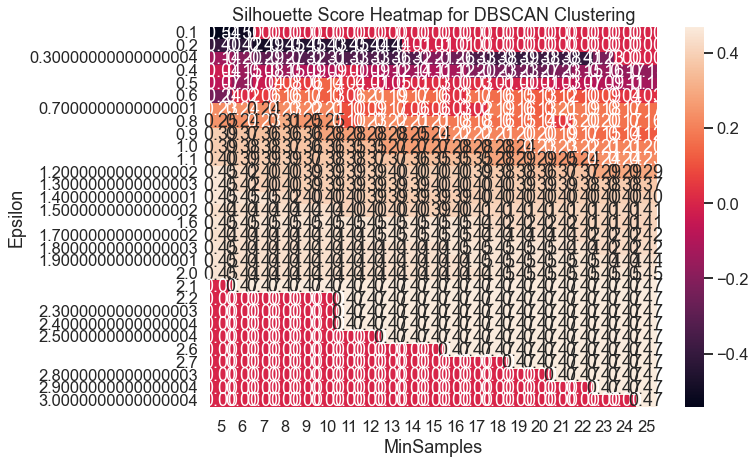

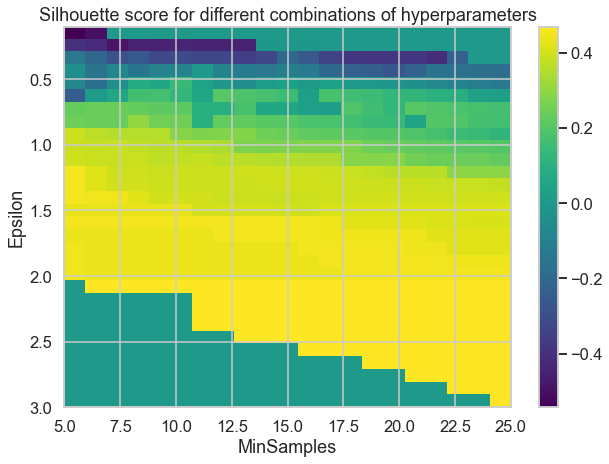

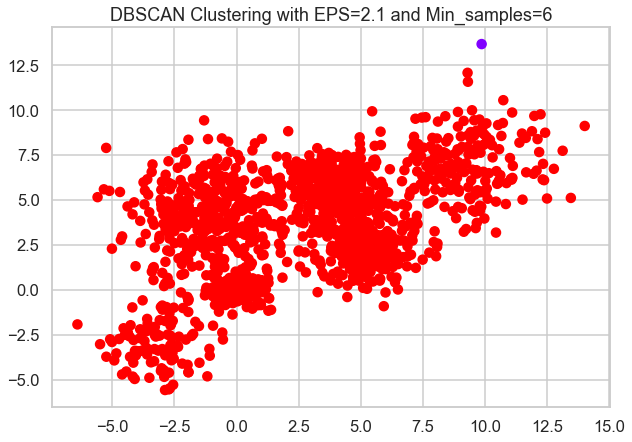

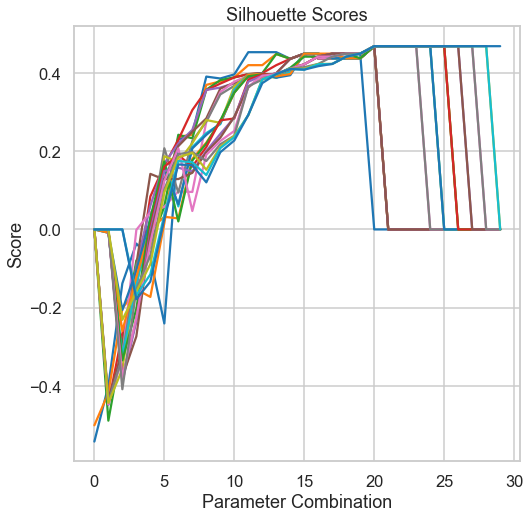

Best Silhouette Score: 0.47


In [10]:
# Define range of hyperparameters to test
Epsilon=np.arange(0.1, 3.1, 0.1)
MinSamples=range(5, 26)
# Loop over hyperparameters and compute silhouette scores
scores_DBS = np.zeros((len(Epsilon), len(MinSamples)))
for i, eps in enumerate(Epsilon):
    for j, min_samples in enumerate(MinSamples):
        DBS = DBSCAN(eps=eps, min_samples=min_samples)
        labels_DBS = DBS.fit_predict(Multi_blob_Data)
        if len(np.unique(labels_DBS)) == 1:
            continue
        # Compute silhouette score
        if len(set(DBS.labels_)) > 1:
            score_DBS = silhouette_score(Multi_blob_Data, DBS.labels_)
        else:
            score_DBS = -1
        
        # Store result
        scores_DBS[i, j] = score_DBS

# Plot heatmap of silhouette scores versus hyperparameters
plt.figure(figsize=(10, 7))
sns.heatmap(scores_DBS, xticklabels=MinSamples, yticklabels=Epsilon, annot=True, fmt='.2f')
plt.xlabel('MinSamples')
plt.ylabel('Epsilon')
plt.title('Silhouette Score Heatmap for DBSCAN Clustering')
plt.show()


# Create a 2D plot of the silhouette scores
fig, ax = plt.subplots(figsize=(10, 7))
im = ax.imshow(scores_DBS, cmap='viridis', aspect='auto',extent=[MinSamples[0], MinSamples[-1], Epsilon[-1], Epsilon[0]])
ax.set_xlabel('MinSamples')
ax.set_ylabel('Epsilon')
ax.set_title('Silhouette score for different combinations of hyperparameters')
plt.colorbar(im)
plt.show()

# Find the hyperparameters that give the best silhouette score
BestEpsilonIndex, BestMinSamplesIndex = np.unravel_index(np.argmax(scores_DBS), scores_DBS.shape)
BestEpsilon = Epsilon[BestEpsilonIndex]
BestMinSamples = MinSamples[BestMinSamplesIndex]
BestScore_DBS = scores_DBS[BestEpsilonIndex, BestMinSamplesIndex]
# Run DBSCAN with best hyperparameters
BestLabels_DBS = DBSCAN(eps=BestEpsilon, min_samples=BestMinSamples).fit_predict(Multi_blob_Data)



# Plot resulting clusters
plt.figure(figsize=(10, 7))
plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=BestLabels_DBS, cmap='rainbow')
plt.title('DBSCAN Clustering with EPS={:.1f} and Min_samples={}'.format(BestEpsilon, BestMinSamples))
plt.show()


plt.plot(scores_DBS)
plt.title("Silhouette Scores")
plt.xlabel("Parameter Combination")
plt.ylabel("Score")
plt.show()

# Print best silhouette score
print('Best Silhouette Score: {:.2f}'.format(BestScore_DBS))

### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

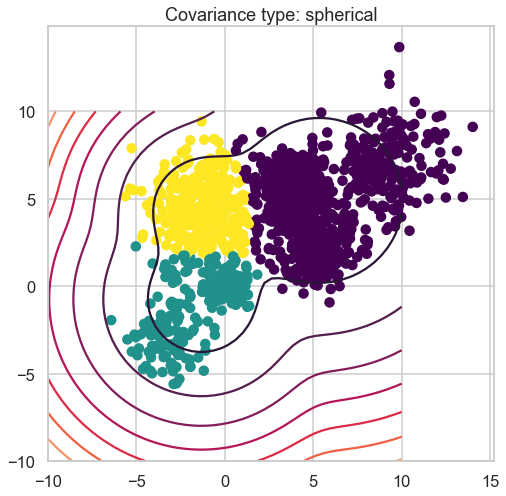

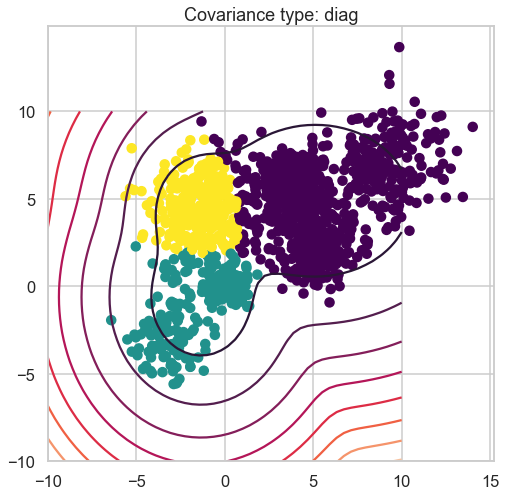

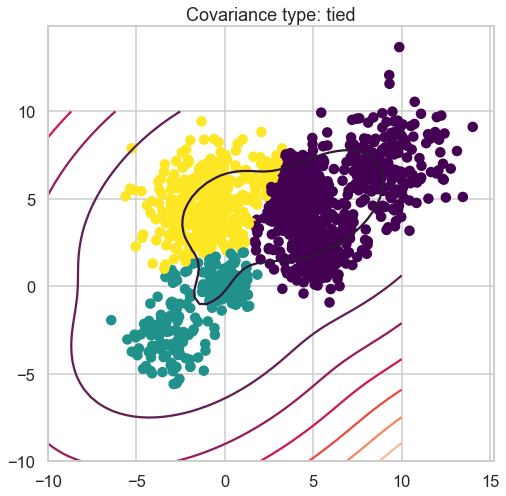

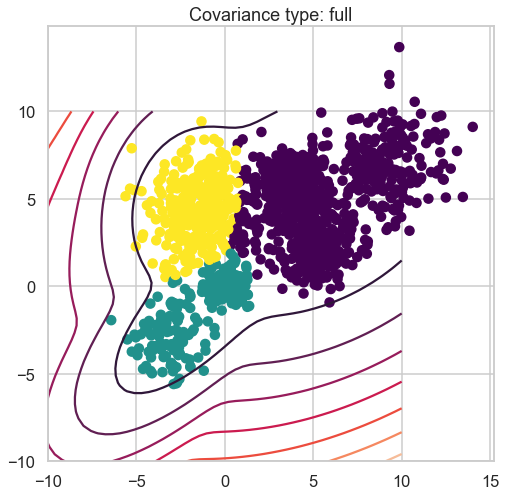

In [11]:
CovarianceTypes = ['spherical', 'diag', 'tied','full']
for cov_type in CovarianceTypes:
    gmm = GaussianMixture(n_components=3, covariance_type=cov_type, random_state=42)
    gmm.fit(Multi_blob_Data)
    labels_gmm = gmm.predict(Multi_blob_Data)

    # Visualize the results
    x = np.linspace(-10, 10)
    y = np.linspace(-10, 10)
    X, Y = np.meshgrid(x, y)
    XX = np.array([X.ravel(), Y.ravel()]).T
    Z = -gmm.score_samples(XX)
    Z = Z.reshape(X.shape)

    plt.contour(X, Y, Z)
    plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], c=labels_gmm, cmap='viridis')
    plt.title(f"Covariance type: {cov_type}")
    plt.show()


## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


In [12]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']
X_IRIS = iris_data.data

# Kmeans clustering

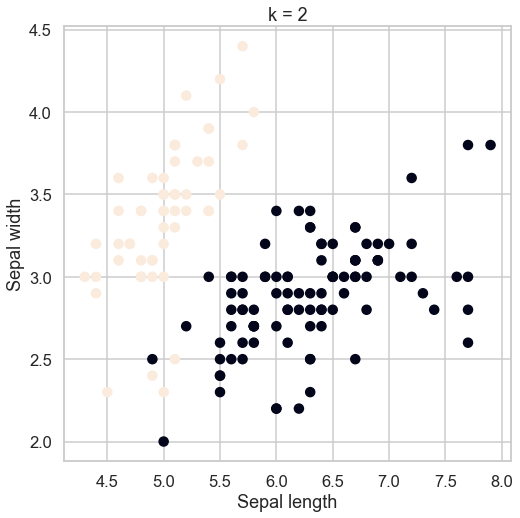

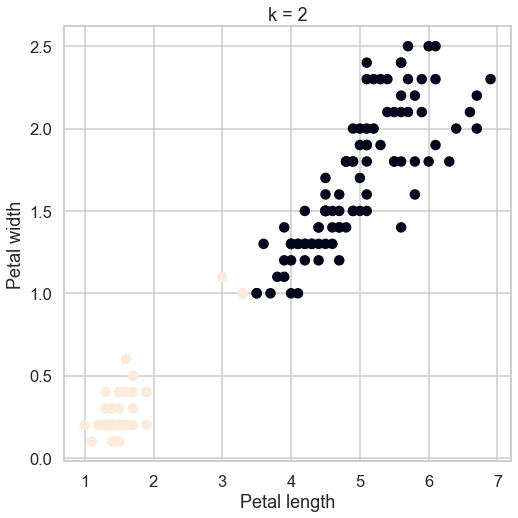

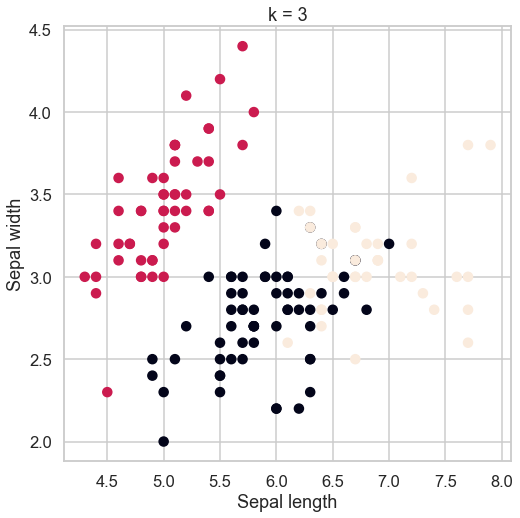

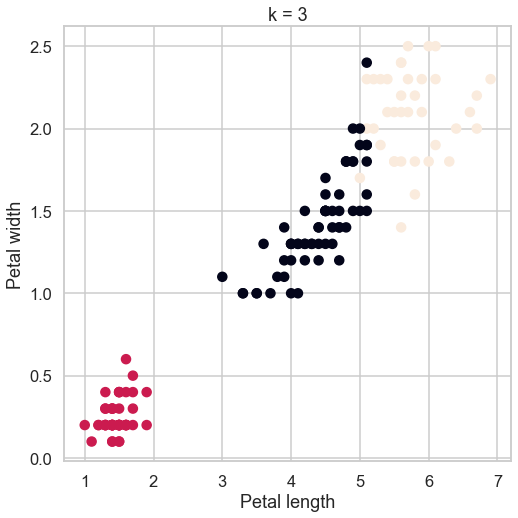

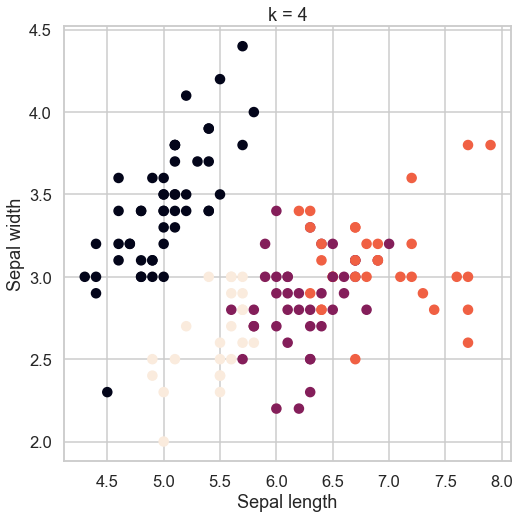

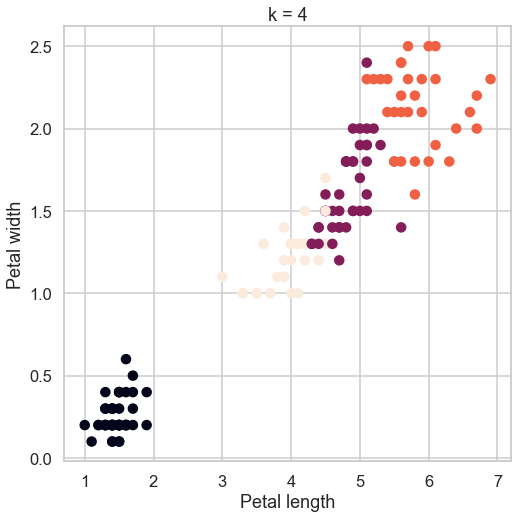

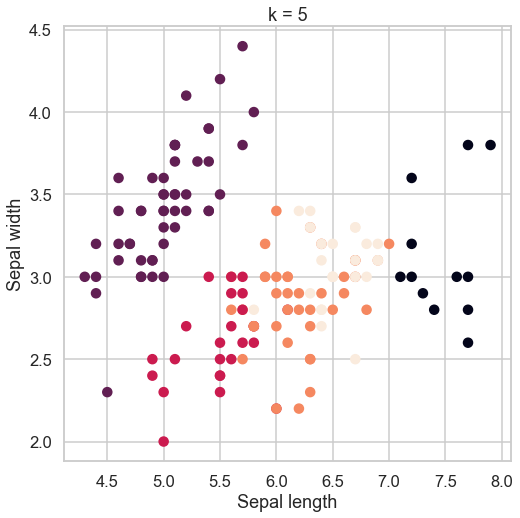

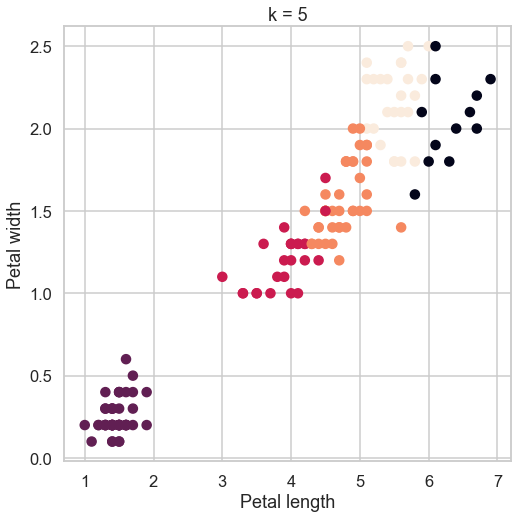

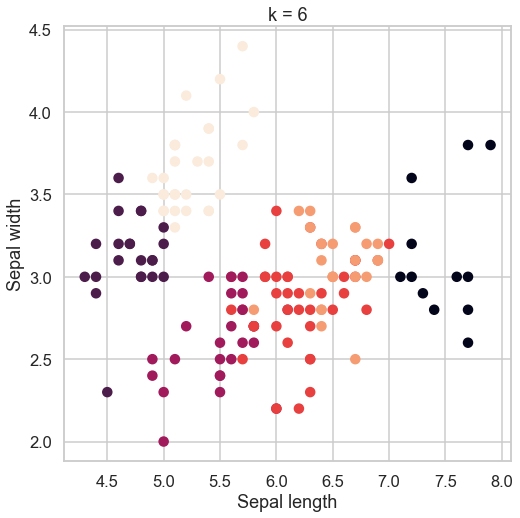

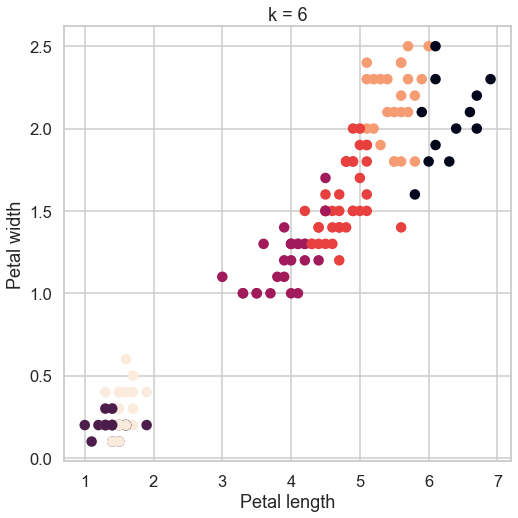

In [13]:
# Define list of values of k to try
KvaluesI=range(2,7)
distortionsI=[]
silhouettesI=[]
# Apply k-means clustering for each value of k and plot results
for K in KvaluesI:
    # Create k-means model with k clusters
    kmeansI = KMeans(n_clusters=K, random_state=42)
    # Fit model to data
    kmeansI.fit(X_IRIS)
    # Get predicted cluster labels for data
    y_predI = kmeansI.predict(X_IRIS)
    distortionsI.append(kmeansI.inertia_)
    if K > 1:
        silhouettesI.append(silhouette_score(X_IRIS, y_predI))
    # Plot results
    plt.scatter(X_IRIS[:, 0], X_IRIS[:, 1], c=y_predI)
    plt.xlabel('Sepal length')
    plt.ylabel('Sepal width')
    plt.title('k = {}'.format(K))
    plt.show()
    plt.scatter(X_IRIS[:, 2], X_IRIS[:, 3], c=y_predI)
    plt.xlabel('Petal length')
    plt.ylabel('Petal width')
    plt.title('k = {}'.format(K))
    plt.show()


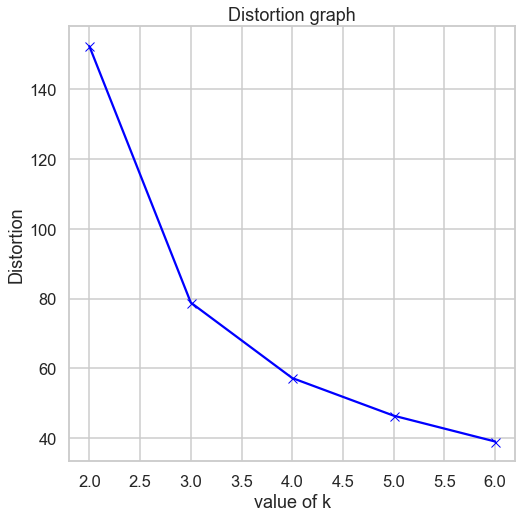

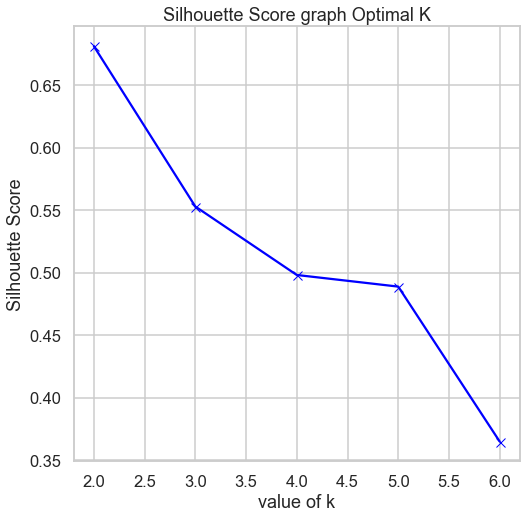

The best K value based on Silhouette Score is: 2


In [14]:
# Plot distortion function vs. K
plt.plot(KvaluesI, distortionsI, 'bx-')
plt.xlabel('value of k')
plt.ylabel('Distortion')
plt.title('Distortion graph')
plt.show()

# Plot silhouette score versus K
plt.plot(KvaluesI, silhouettesI, 'bx-')
plt.xlabel('value of k')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score graph Optimal K')
plt.show()

# Find the best K value based on the highest silhouette score
BestkI = np.argmax(silhouettesI) + 2  # Add 2 to account for range of K values starting from 2
print("The best K value based on Silhouette Score is:", BestkI)

# Hierarichal Clustering

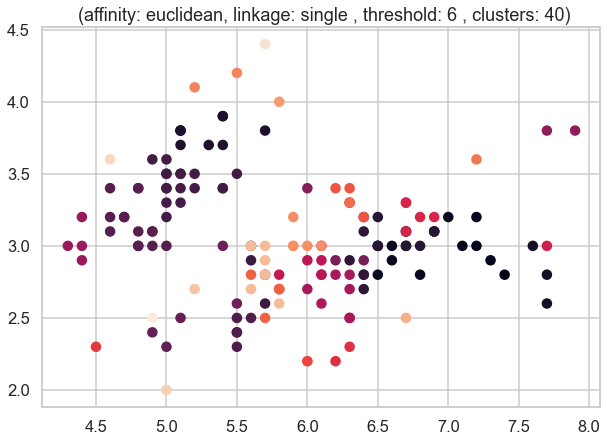

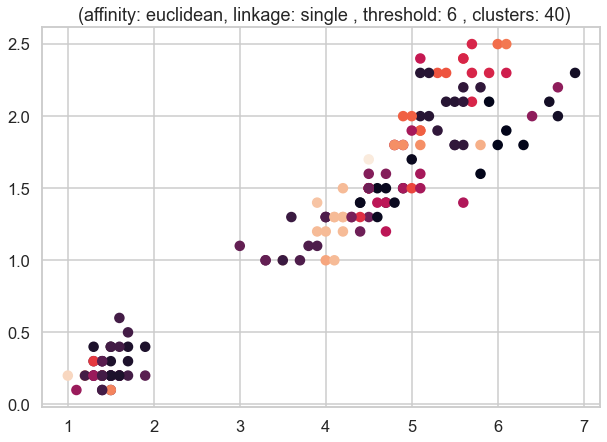

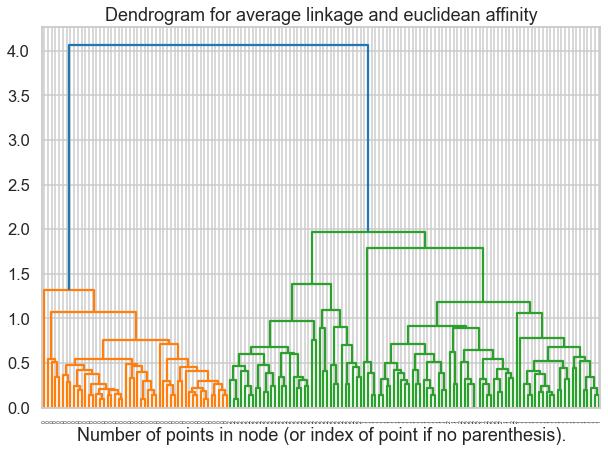

Silhouette score: 0.28022113778340446
Number of clusters: 40


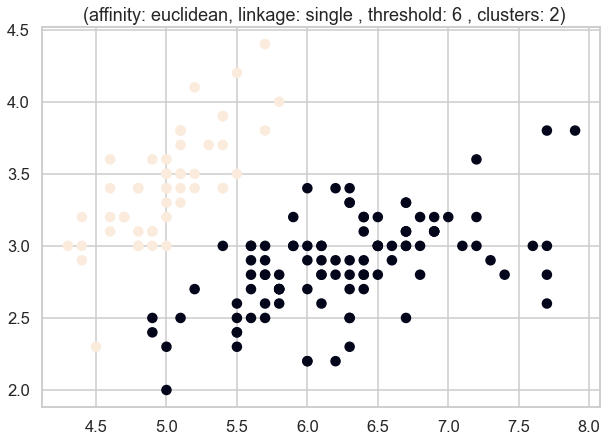

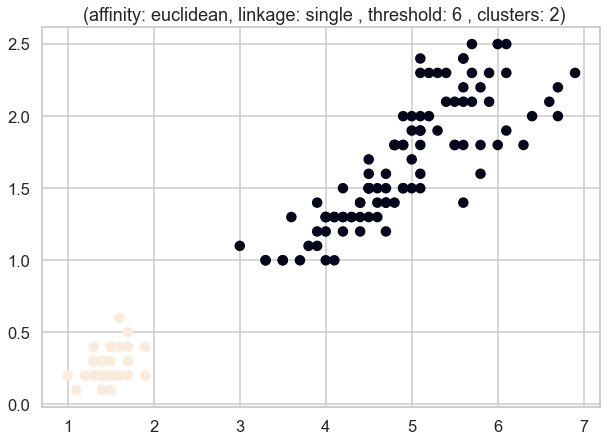

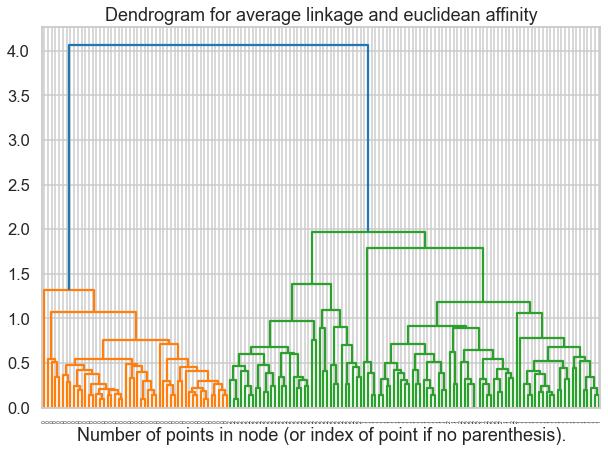

Silhouette score: 0.28022113778340446
Number of clusters: 2


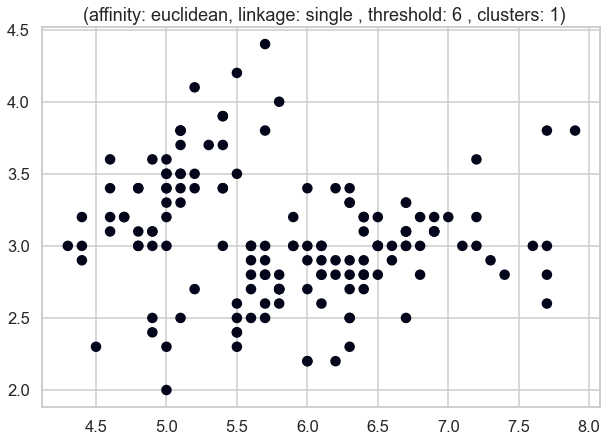

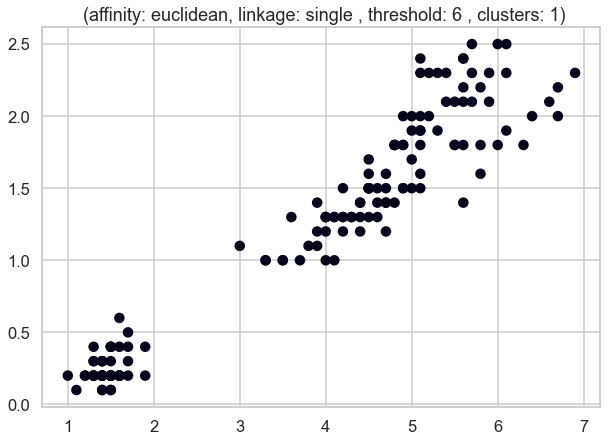

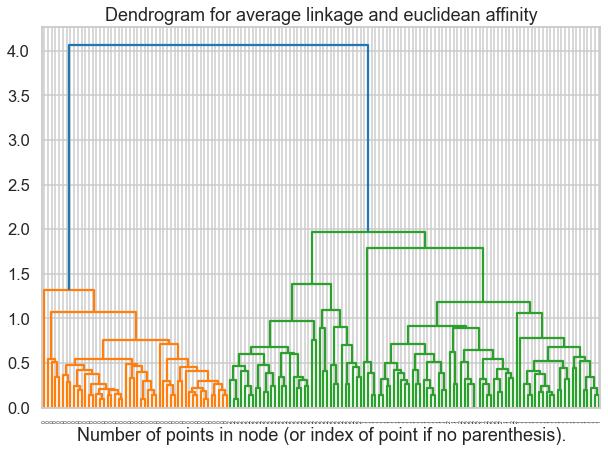

Silhouette score: 0.28022113778340446
Number of clusters: 1


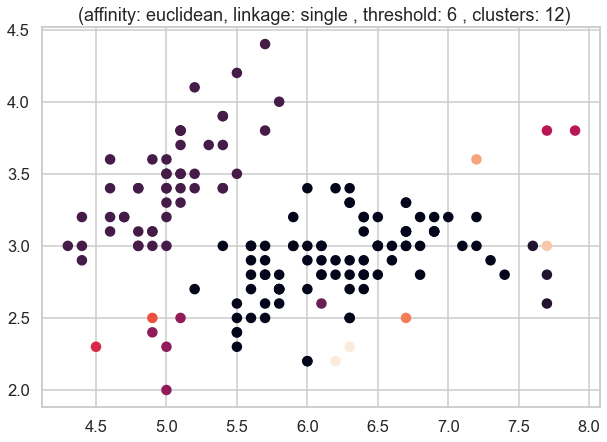

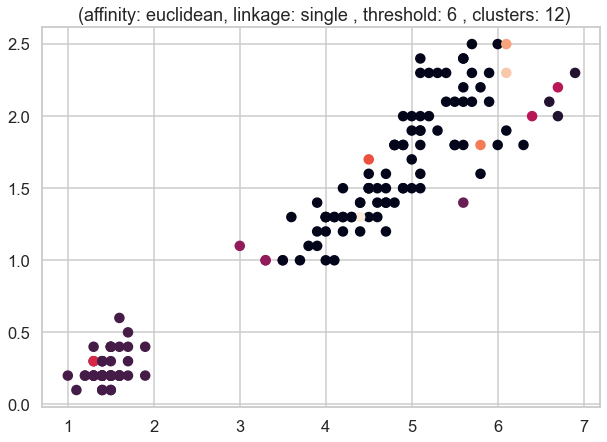

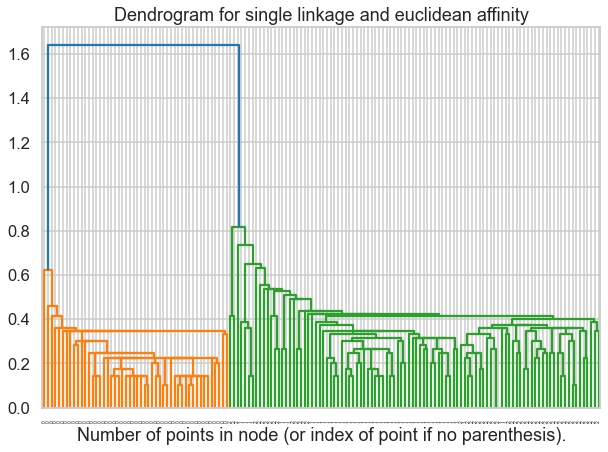

Silhouette score: 0.28022113778340446
Number of clusters: 12


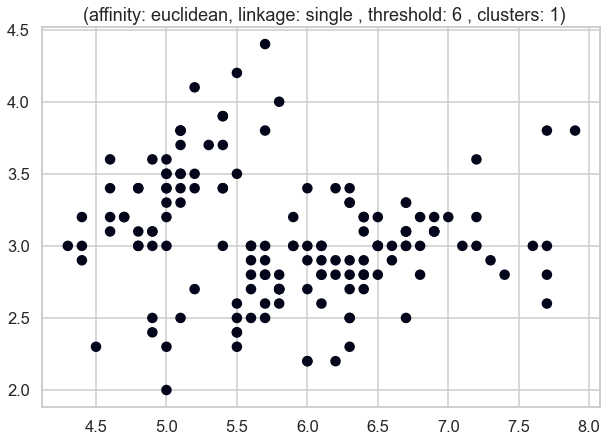

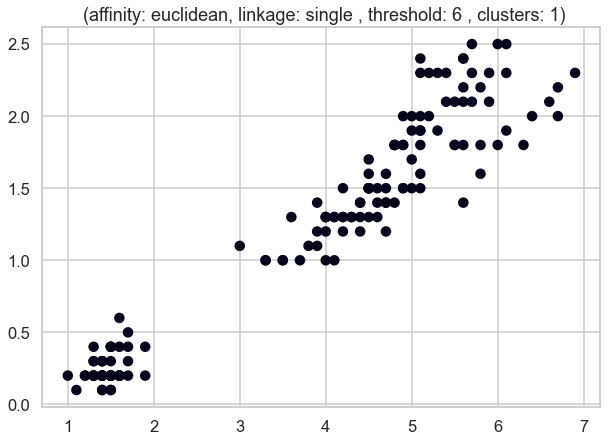

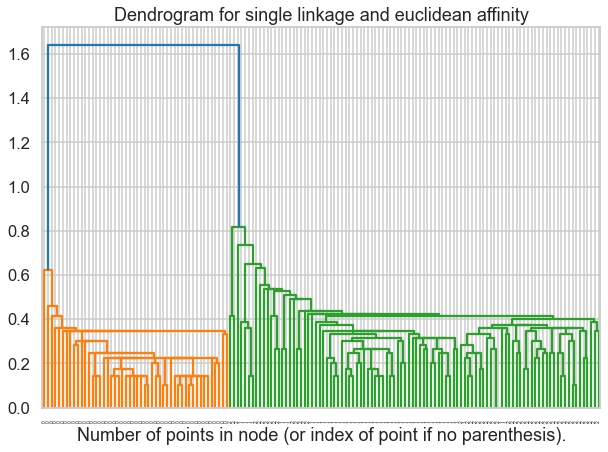

Silhouette score: 0.28022113778340446
Number of clusters: 1


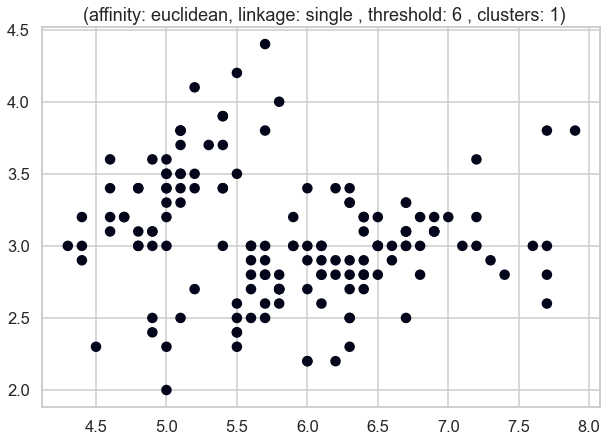

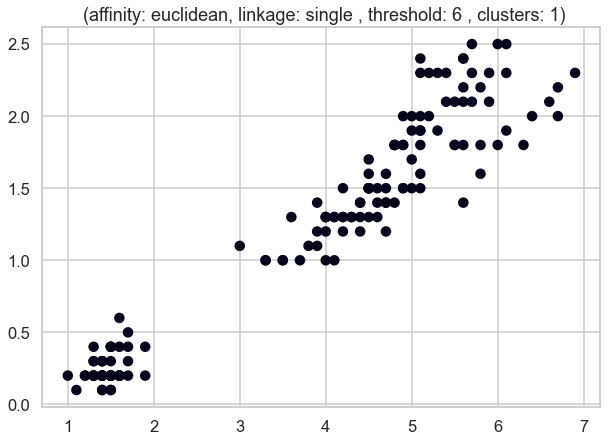

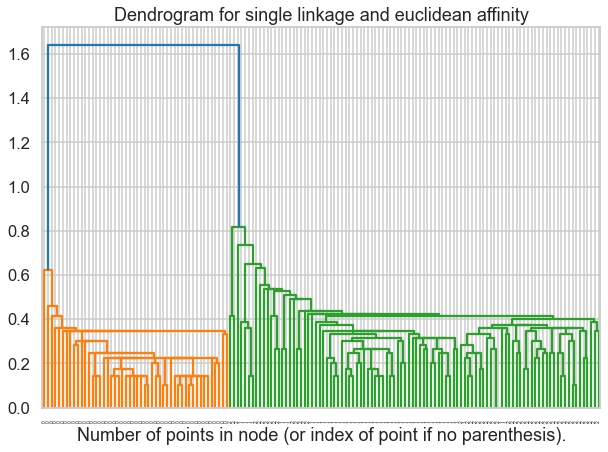

Silhouette score: 0.28022113778340446
Number of clusters: 1


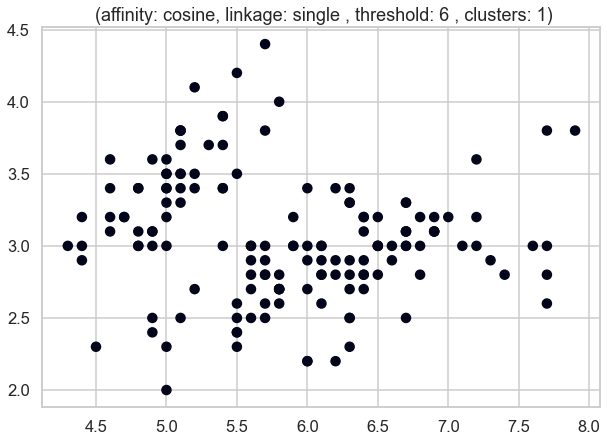

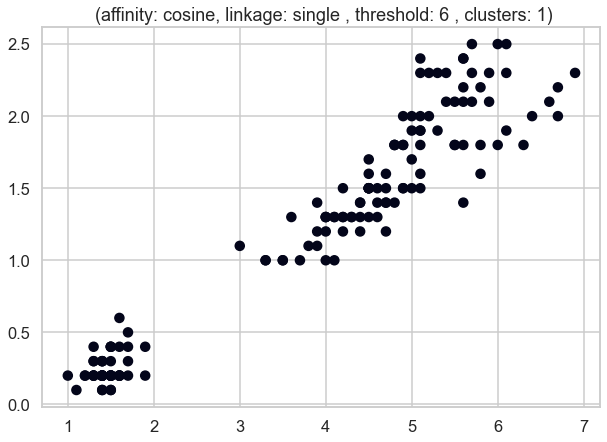

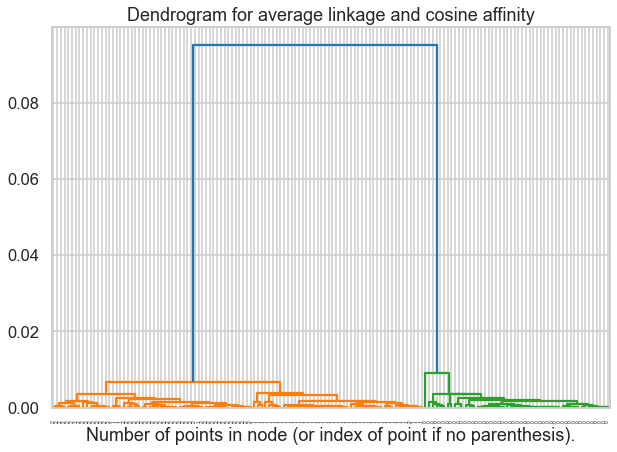

Silhouette score: 0.28022113778340446
Number of clusters: 1


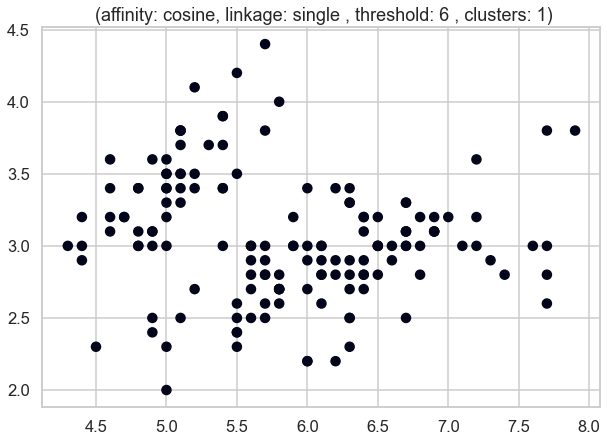

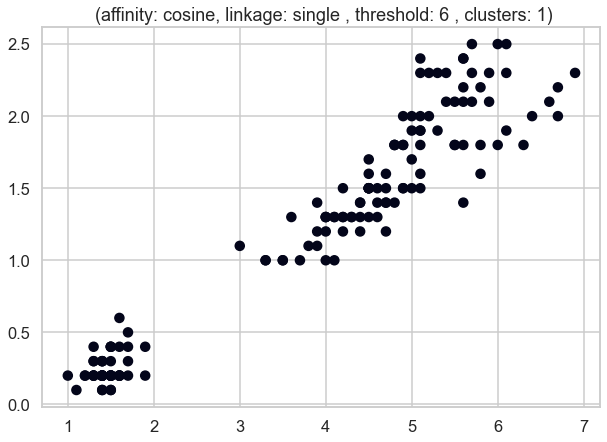

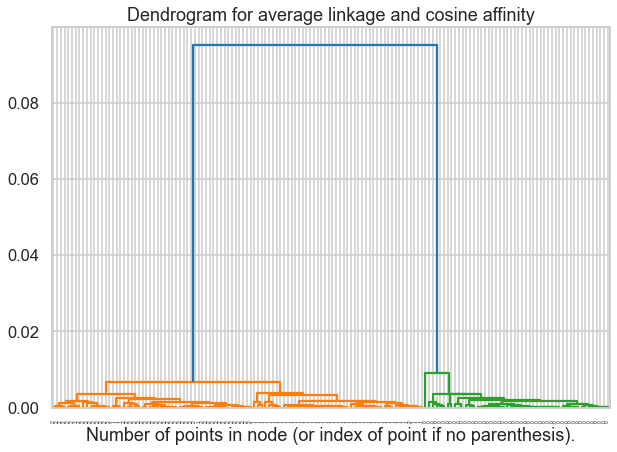

Silhouette score: 0.28022113778340446
Number of clusters: 1


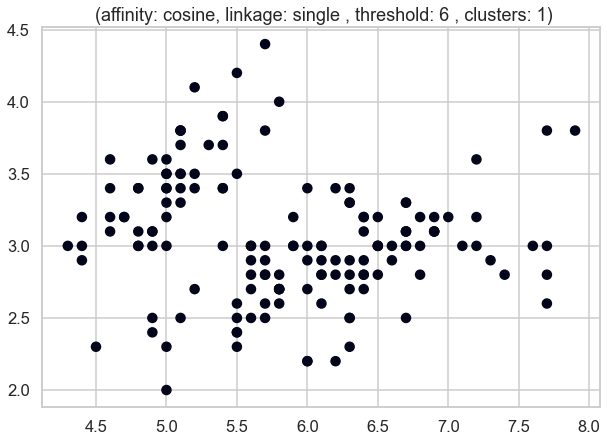

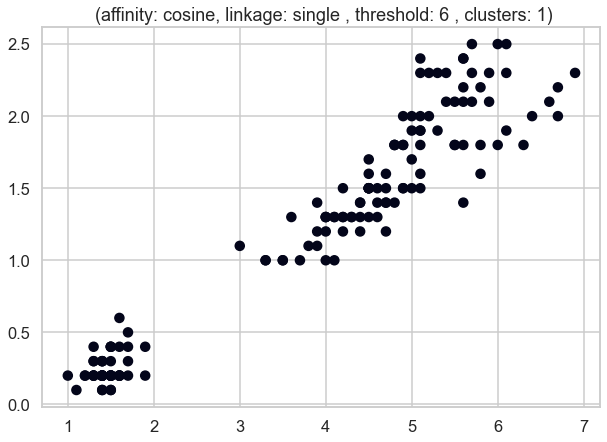

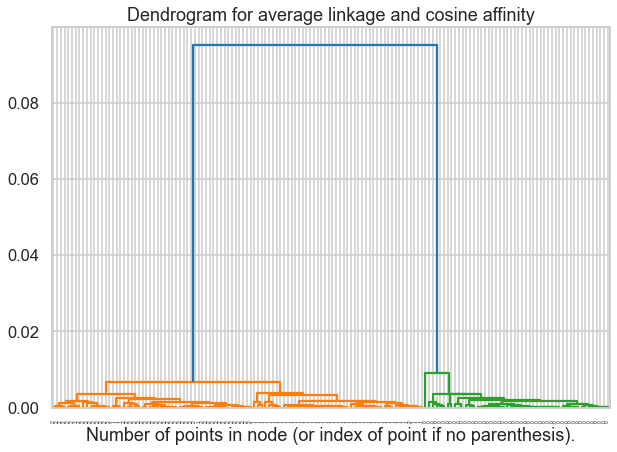

Silhouette score: 0.28022113778340446
Number of clusters: 1


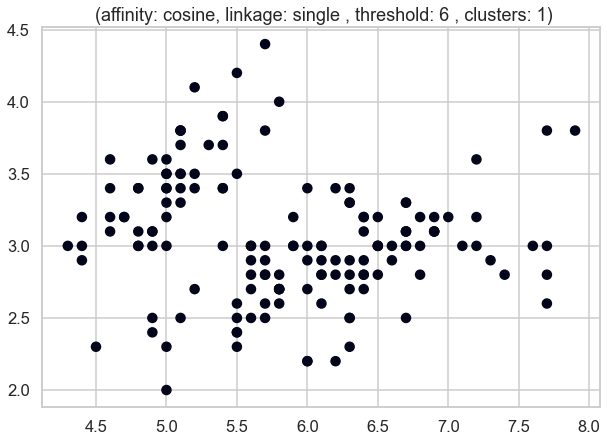

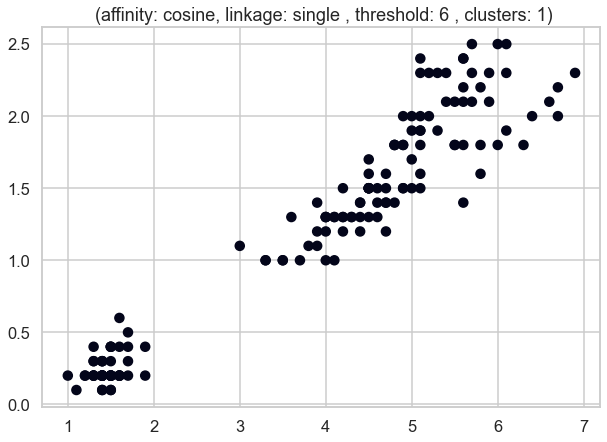

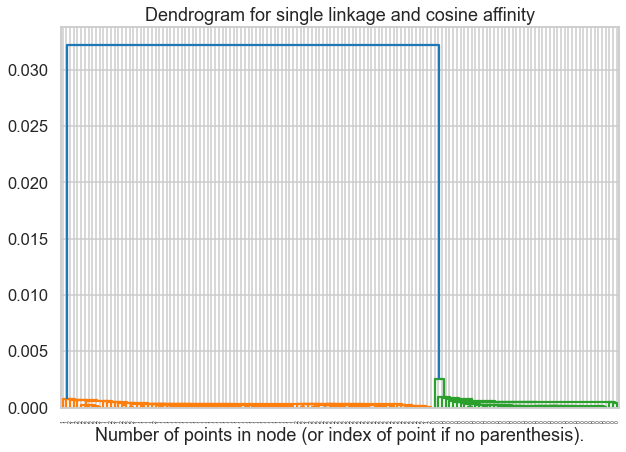

Silhouette score: 0.28022113778340446
Number of clusters: 1


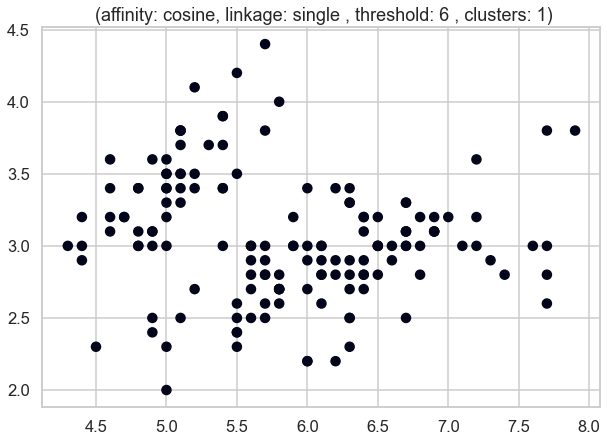

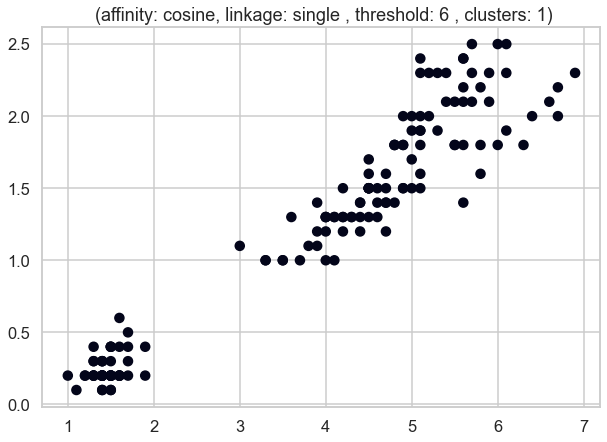

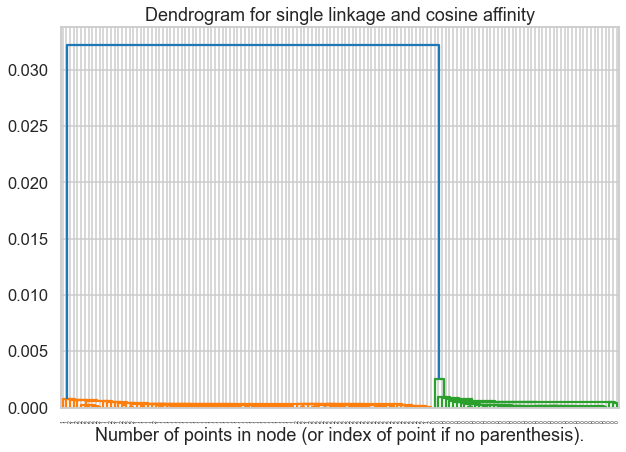

Silhouette score: 0.28022113778340446
Number of clusters: 1


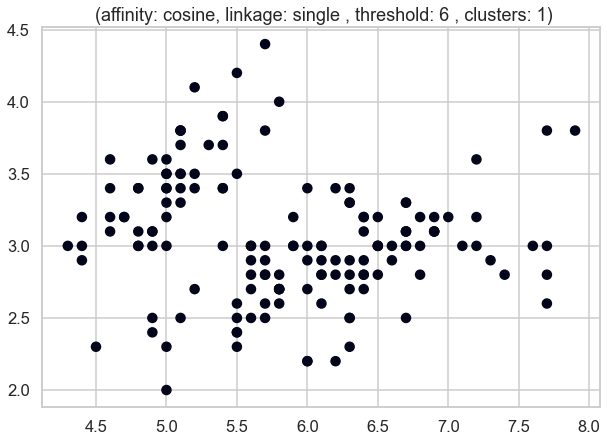

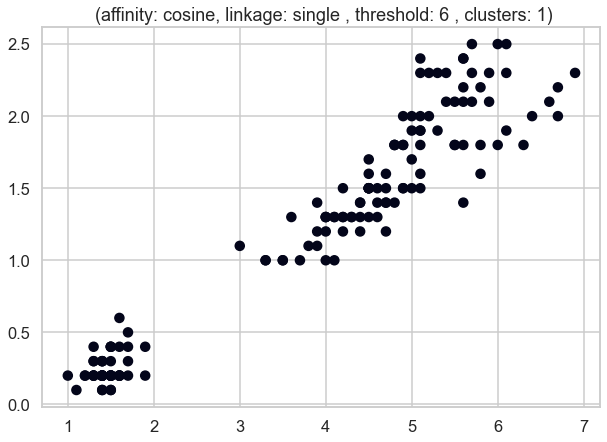

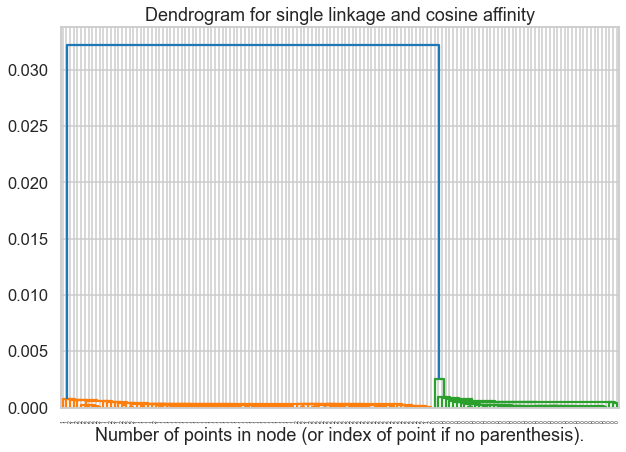

Silhouette score: 0.28022113778340446
Number of clusters: 1
Best Silhouette score: 0.6867350732769776
Number of clusters in best model: 2


In [15]:
# define parameter combinations to try
NumOfClustersI=[]
affinitiesI=['euclidean', 'cosine']
linkagesI=['average', 'single']
thresholdsI=[0.5,2,6]
BestScoreI_HC=-1
BestModelI_HC=None

for affinity in affinitiesI:
    for linkage in linkagesI:
        for dist_thresh in thresholdsI:
            HCI = AgglomerativeClustering(n_clusters=None,affinity=affinity,linkage=linkage,distance_threshold=dist_thresh)
            labelsI_HC = HCI.fit_predict(X_IRIS)
            NumOfClustersI.append(HCI.n_clusters_)
            # Display resulting clusters for current parameter combination
            plt.figure(figsize=(10, 7))
            plt.scatter(X_IRIS[:, 0], X_IRIS[:, 1], c=labelsI_HC)
            plt.title(f" (affinity: {affinity}, linkage: {linkage_method} , threshold: {threshold} , clusters: {HCI.n_clusters_})")
            plt.show()
            plt.figure(figsize=(10, 7))
            plt.scatter(X_IRIS[:, 2], X_IRIS[:, 3], c=labelsI_HC)
            plt.title(f" (affinity: {affinity}, linkage: {linkage_method} , threshold: {threshold} , clusters: {HCI.n_clusters_})")
            plt.show()
            try:
                scoreI_HC=silhouette_score(X_IRIS, labelsI_HC)
            except ValueError:
                pass
            
            # Keep track of best score and best parameters
            if scoreI_HC > BestScoreI_HC:
                BestScoreI_HC = scoreI_HC
                BestModelI_HC = HCI
            
            # Display dendrogram for current parameter combination
            plt.figure(figsize=(10, 7))
            plt.title("Dendrogram for {} linkage and {} affinity".format(linkage, affinity))
            distancesI = pdist(X_IRIS, metric=affinity)
            ZI = hierarchy.linkage(distancesI, method=linkage)
            dendrogramI = hierarchy.dendrogram(ZI, labels=iris_data.target)
            plt.xlabel("Number of points in node (or index of point if no parenthesis).")
            plt.show()
            print(f"Silhouette score: {score_HC}")
            print(f"Number of clusters: {len(set(HCI.labels_))}")
        
                
                
            
print(f"Best Silhouette score: {BestScoreI_HC}")
print(f"Number of clusters in best model: {len(set(BestModelI_HC.labels_))}")



# DBscan

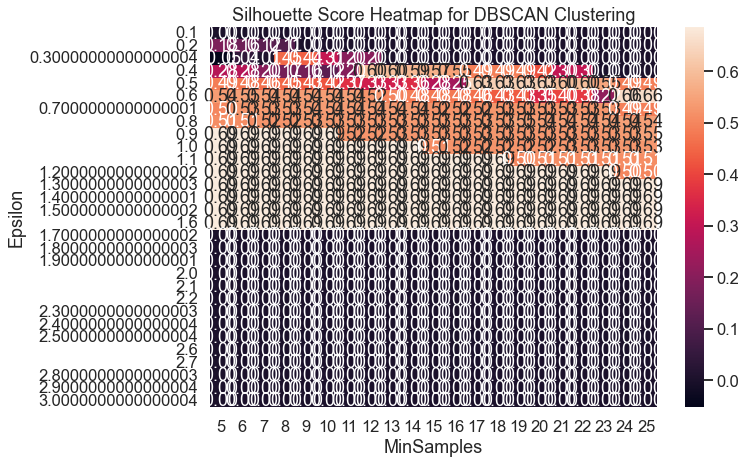

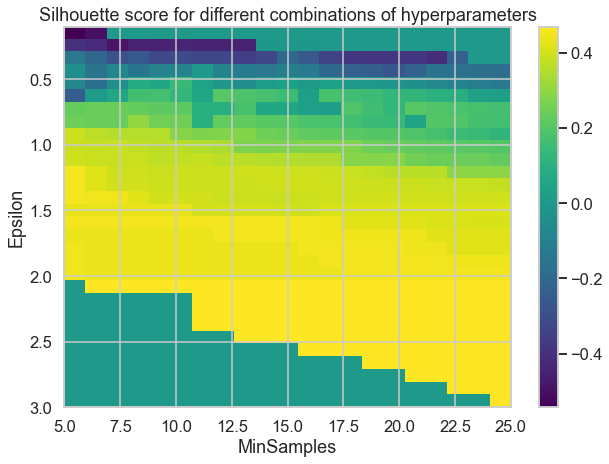

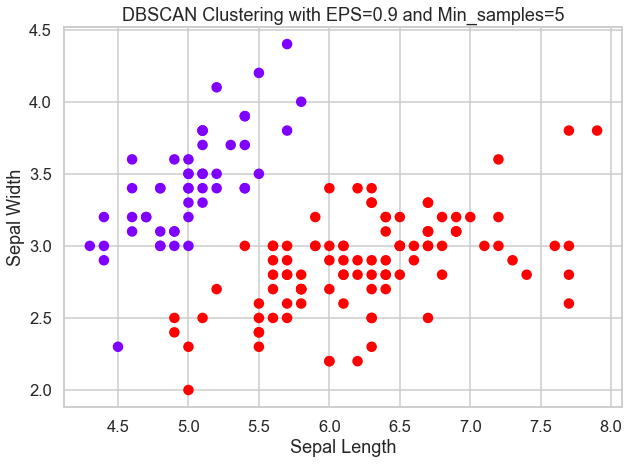

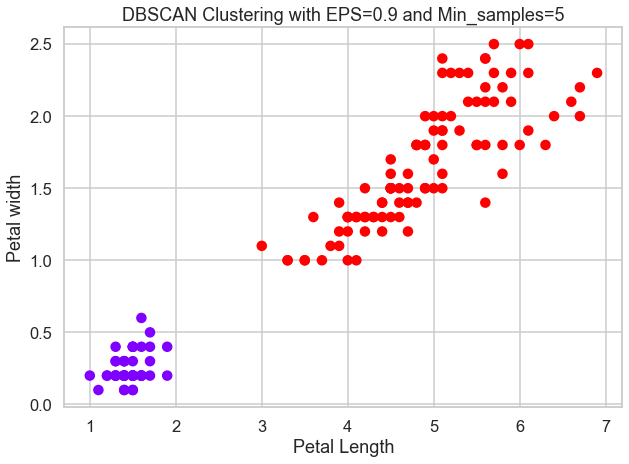

Best Silhouette Score: 0.69


In [16]:
# Define range of hyperparameters to test
EpsilonI=np.arange(0.1, 3.1, 0.1)
MinSamplesI=range(5, 26)
# Loop over hyperparameters and compute silhouette scores
scoresI_DBS = np.zeros((len(EpsilonI), len(MinSamplesI)))
for i, eps in enumerate(EpsilonI):
    for j, min_samples in enumerate(MinSamplesI):
        DBSI = DBSCAN(eps=eps, min_samples=min_samples)
        labelsI_DBS = DBSI.fit_predict(X_IRIS)
        if len(np.unique(labelsI_DBS)) == 1:
            continue
        # Compute silhouette score
        if len(set(DBSI.labels_)) > 1:
            scoreI_DBS = silhouette_score(X_IRIS, DBSI.labels_)
        else:
            scoreI_DBS = -1
        
        # Store result
        scoresI_DBS[i, j] = scoreI_DBS

# Plot heatmap of silhouette scores versus hyperparameters
plt.figure(figsize=(10, 7))
sns.heatmap(scoresI_DBS, xticklabels=MinSamplesI, yticklabels=EpsilonI, annot=True, fmt='.2f')
plt.xlabel('MinSamples')
plt.ylabel('Epsilon')
plt.title('Silhouette Score Heatmap for DBSCAN Clustering')
plt.show()


# Create a 2D plot of the silhouette scores
fig, ax = plt.subplots(figsize=(10, 7))
im = ax.imshow(scores_DBS, cmap='viridis', aspect='auto',extent=[MinSamplesI[0], MinSamplesI[-1], EpsilonI[-1], EpsilonI[0]])
ax.set_xlabel('MinSamples')
ax.set_ylabel('Epsilon')
ax.set_title('Silhouette score for different combinations of hyperparameters')
plt.colorbar(im)
plt.show()

# Find the hyperparameters that give the best silhouette score
BestEpsilonIndexI, BestMinSamplesIndexI = np.unravel_index(np.argmax(scoresI_DBS), scoresI_DBS.shape)
BestEpsilonI = EpsilonI[BestEpsilonIndexI]
BestMinSamplesI = MinSamplesI[BestMinSamplesIndexI]
BestScoreI_DBS = scoresI_DBS[BestEpsilonIndexI, BestMinSamplesIndexI]
# Run DBSCAN with best hyperparameters
BestLabelsI_DBS = DBSCAN(eps=BestEpsilonI, min_samples=BestMinSamplesI).fit_predict(X_IRIS)



# Plot resulting clusters
plt.figure(figsize=(10, 7))
plt.scatter(X_IRIS[:, 0], X_IRIS[:, 1], c=BestLabelsI_DBS, cmap='rainbow')
plt.xlabel('Sepal Length')
plt.ylabel('Sepal Width')
plt.title('DBSCAN Clustering with EPS={:.1f} and Min_samples={}'.format(BestEpsilonI, BestMinSamplesI))
plt.show()
plt.figure(figsize=(10, 7))
plt.scatter(X_IRIS[:, 2], X_IRIS[:, 3], c=BestLabelsI_DBS, cmap='rainbow')
plt.xlabel('Petal Length')
plt.ylabel('Petal width')
plt.title('DBSCAN Clustering with EPS={:.1f} and Min_samples={}'.format(BestEpsilonI, BestMinSamplesI))
plt.show()

# Print best silhouette score
print('Best Silhouette Score: {:.2f}'.format(BestScoreI_DBS))


# Gaussian mixture

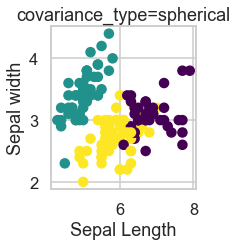

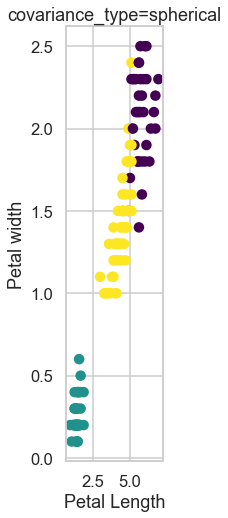

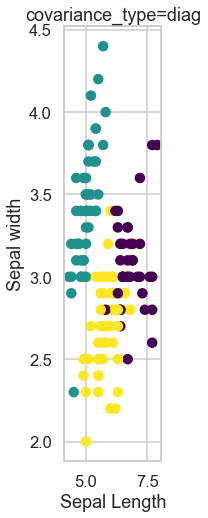

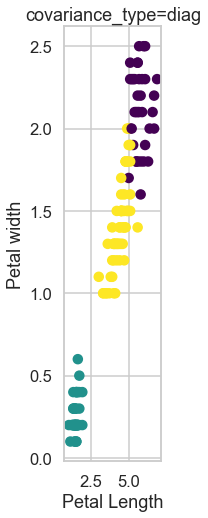

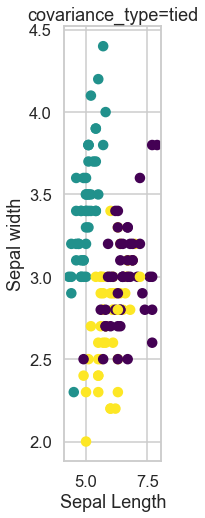

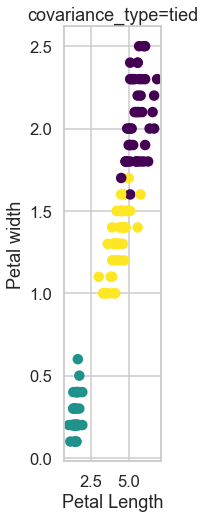

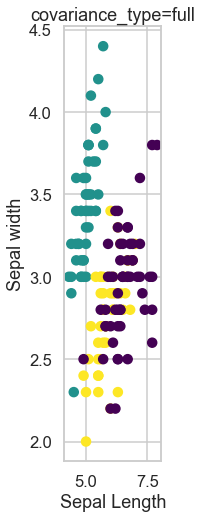

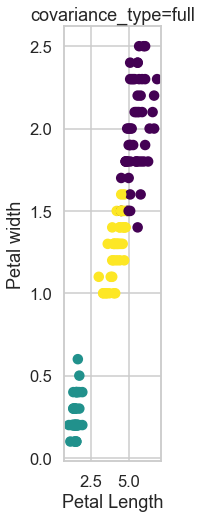

In [17]:
# Fit GMM model with different covariance_type parameters
CovarianceTypesI = ['spherical', 'diag', 'tied','full']
plt.figure(figsize=(12, 3))
for i, cov_type in enumerate(CovarianceTypesI):
    # Fit GMM model
    gmmI = GaussianMixture(n_components=3, covariance_type=cov_type, random_state=42)
    gmmI.fit(X)
    y_predI_gmm = gmmI.fit_predict(X_IRIS)
    

    # Plot the resulting clusters
    plt.subplot(1, 4, i+1)
    plt.scatter(X_IRIS[:, 0], X_IRIS[:, 1], c=y_predI_gmm, cmap='viridis')
    plt.xlabel('Sepal Length')
    plt.ylabel('Sepal width')
    plt.title(f'covariance_type={cov_type}')
    plt.show()
    plt.subplot(1, 4, i+1)
    plt.scatter(X_IRIS[:, 2], X_IRIS[:, 3], c=y_predI_gmm, cmap='viridis')
    plt.xlabel('Petal Length')
    plt.ylabel('Petal width')
    plt.title(f'covariance_type={cov_type}')
    plt.show()


* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

# Normalization and PCA for Iris dataset

In [18]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd

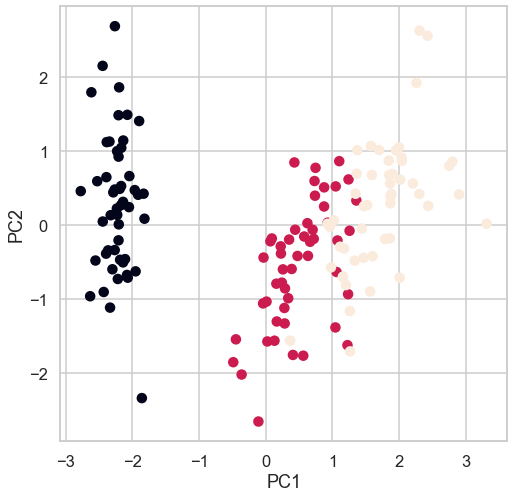

In [19]:
y_IRIS=iris_data.target
# Standardize the data
scalerI = StandardScaler()
X_stdI = scalerI.fit_transform(X_IRIS)

# Instantiate PCA object with desired number of components
pcaI = PCA(n_components=2)

# Fit and transform the data
X_pcaI = pcaI.fit_transform(X_stdI)

# Plot the transformed data
import matplotlib.pyplot as plt
plt.scatter(X_pcaI[:, 0],X_pcaI[:, 1], c=y_IRIS)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()


# Kmeans clustering

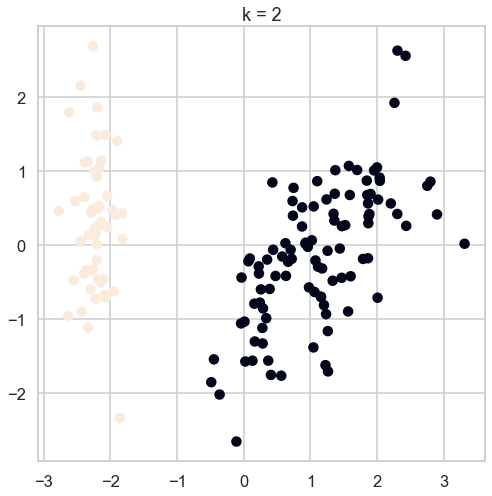

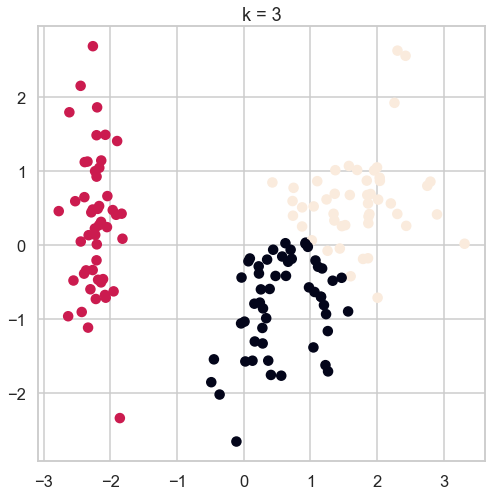

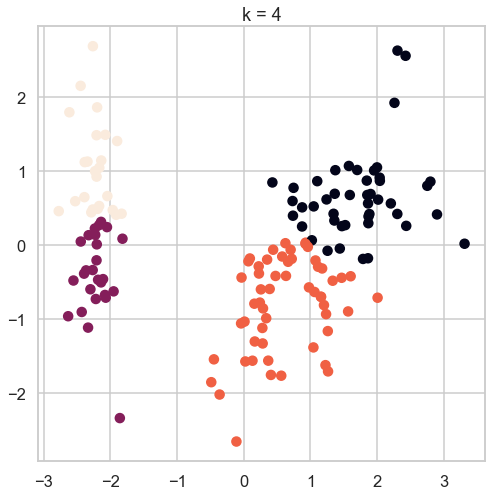

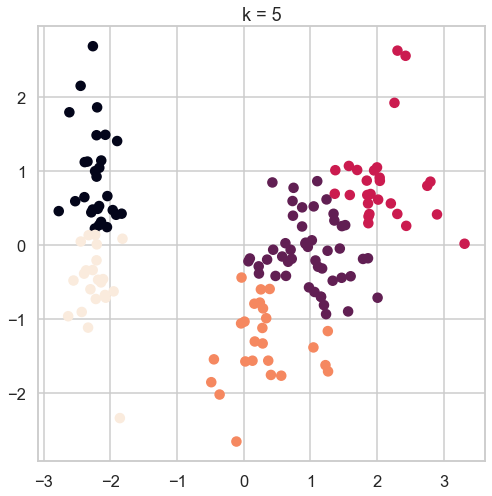

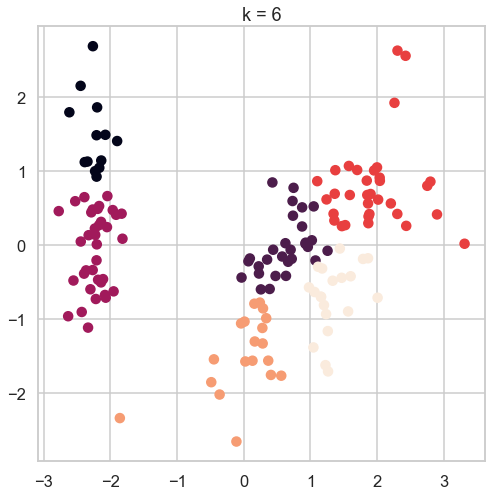

In [20]:
# Define list of values of k to try
Kvaluesi=range(2,7)
distortionsi=[]
silhouettesi=[]
# Apply k-means clustering for each value of k and plot results
for K in Kvaluesi:
    # Create k-means model with k clusters
    kmeansi = KMeans(n_clusters=K, random_state=42)
    # Fit model to data
    kmeansi.fit(X_pcaI)
    # Get predicted cluster labels for data
    y_predi = kmeansi.predict(X_pcaI)
    distortionsi.append(kmeansi.inertia_)
    if K > 1:
        silhouettesi.append(silhouette_score(X_pcaI, y_predi))
    # Plot results
    plt.scatter(X_pcaI[:, 0], X_pcaI[:, 1], c=y_predi)
    plt.title('k = {}'.format(K))
    plt.show()

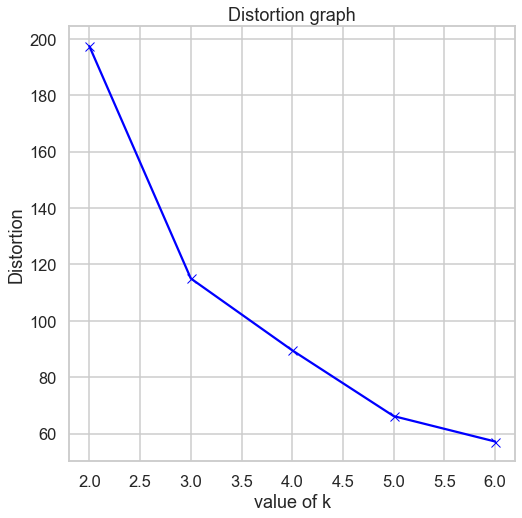

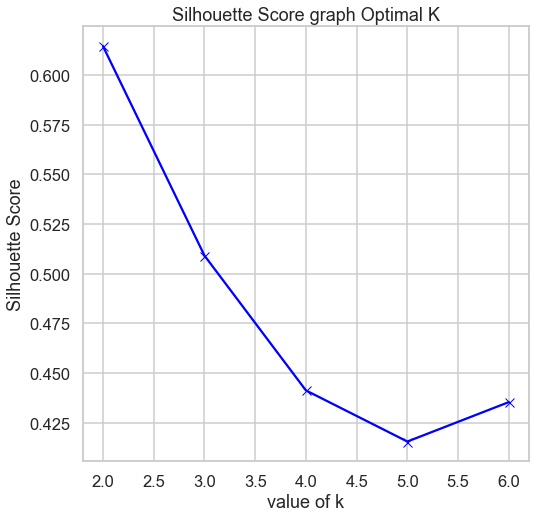

The best K value based on Silhouette Score is: 2


In [21]:
# Plot distortion function vs. K
plt.plot(Kvaluesi, distortionsi, 'bx-')
plt.xlabel('value of k')
plt.ylabel('Distortion')
plt.title('Distortion graph')
plt.show()

# Plot silhouette score versus K
plt.plot(Kvaluesi, silhouettesi, 'bx-')
plt.xlabel('value of k')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score graph Optimal K')
plt.show()

# Find the best K value based on the highest silhouette score
Bestki = np.argmax(silhouettesi) + 2  # Add 2 to account for range of K values starting from 2
print("The best K value based on Silhouette Score is:", Bestki)

# Hierarichal clustering

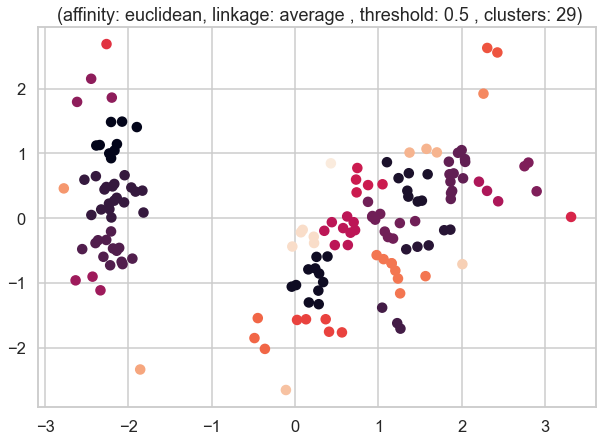

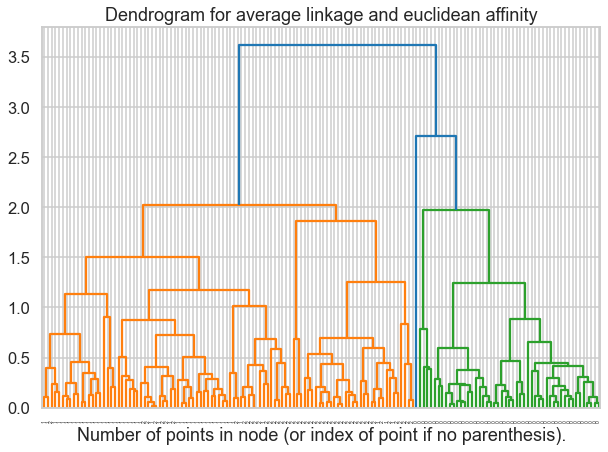

Silhouette score: 0.38102739308472733
Number of clusters: 29


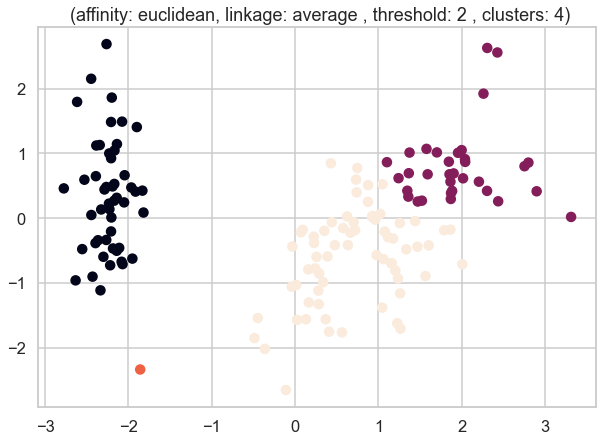

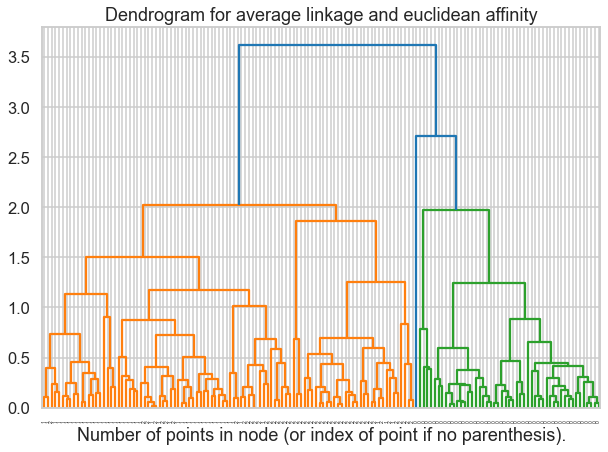

Silhouette score: 0.4550547399234779
Number of clusters: 4


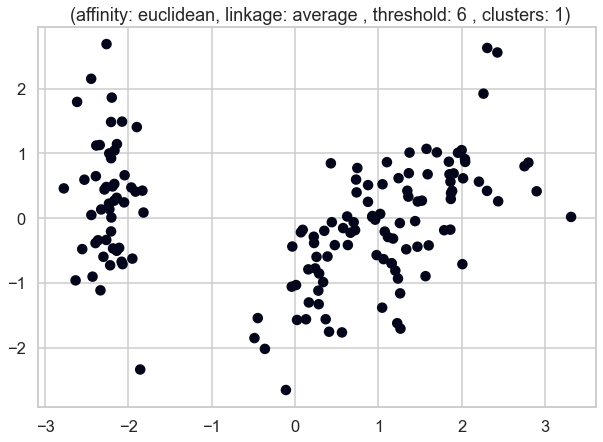

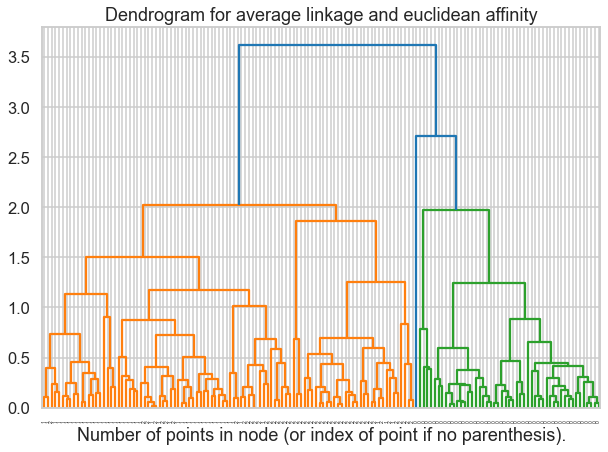

Silhouette score: 0.4550547399234779
Number of clusters: 1


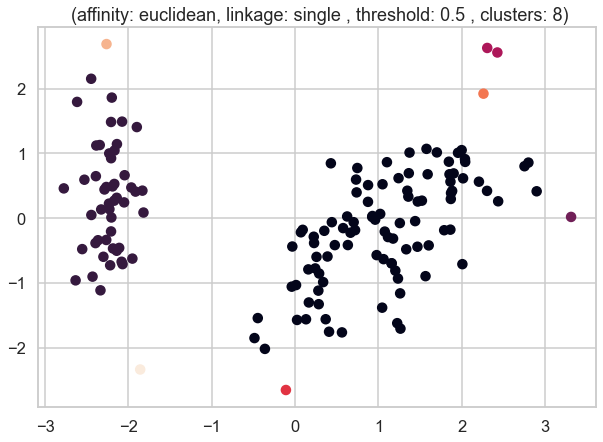

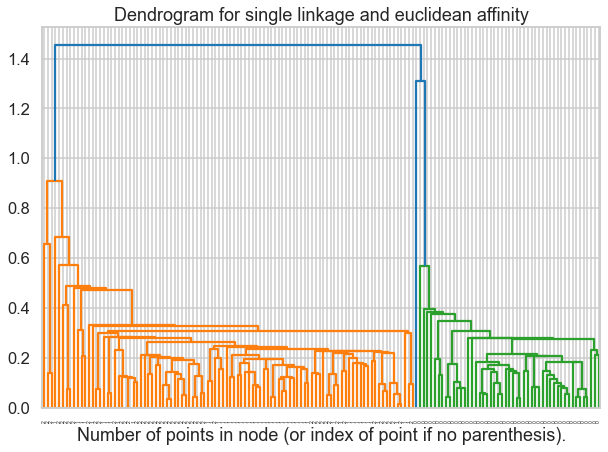

Silhouette score: 0.24621503378580992
Number of clusters: 8


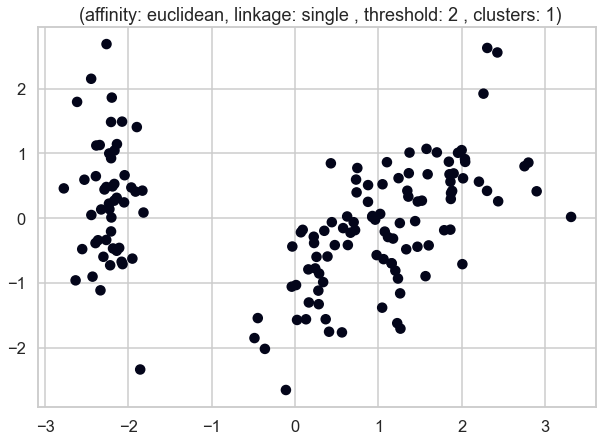

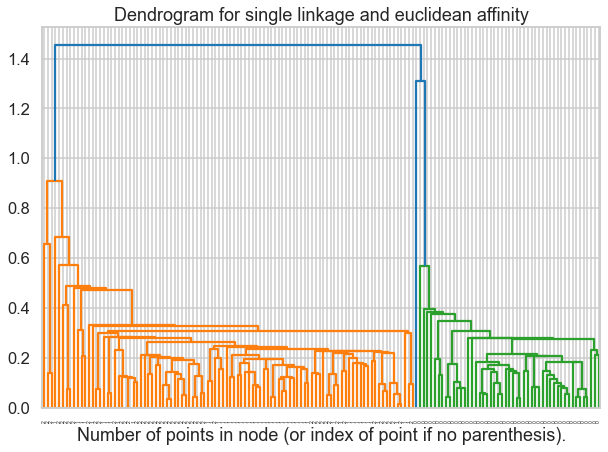

Silhouette score: 0.24621503378580992
Number of clusters: 1


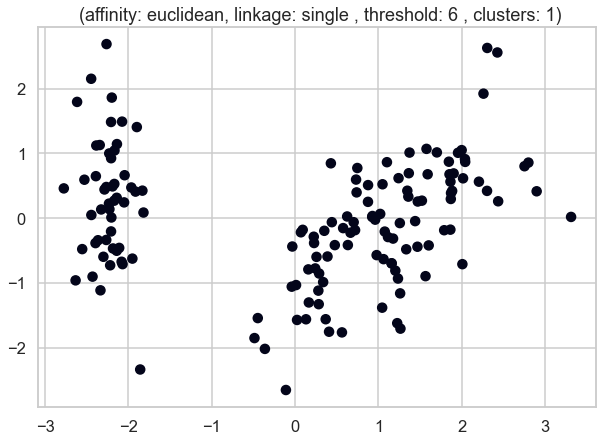

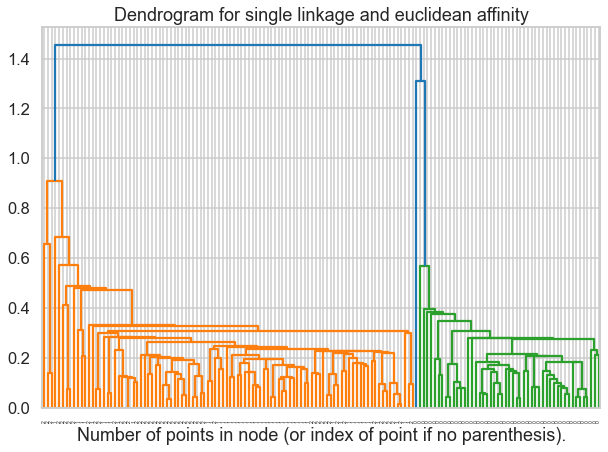

Silhouette score: 0.24621503378580992
Number of clusters: 1


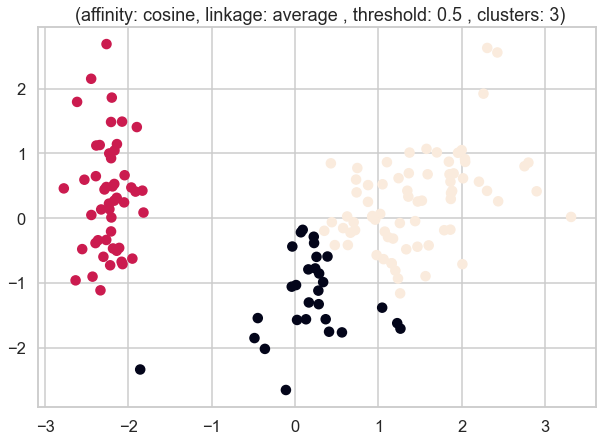

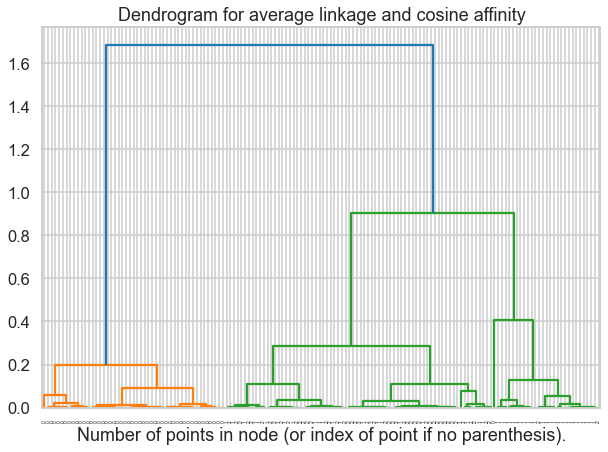

Silhouette score: 0.4941504670863973
Number of clusters: 3


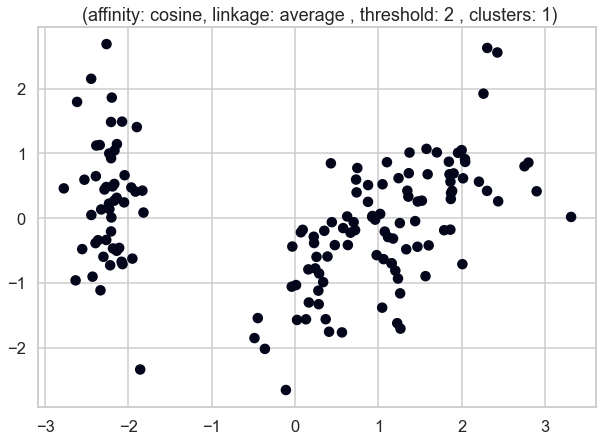

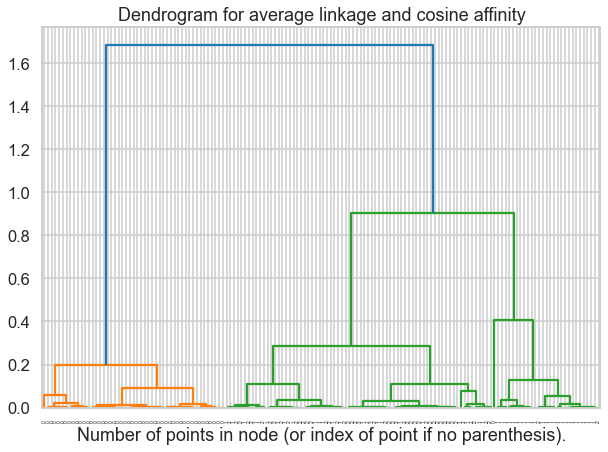

Silhouette score: 0.4941504670863973
Number of clusters: 1


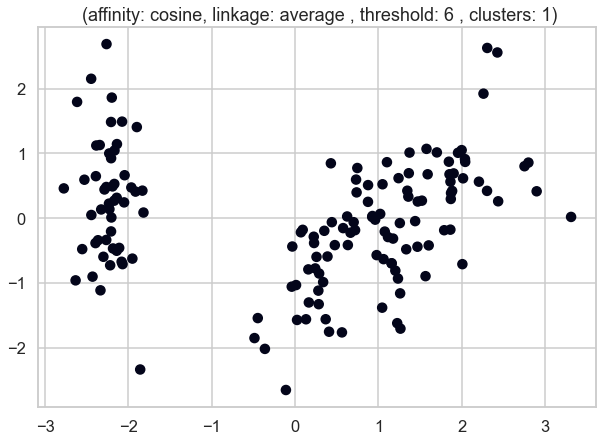

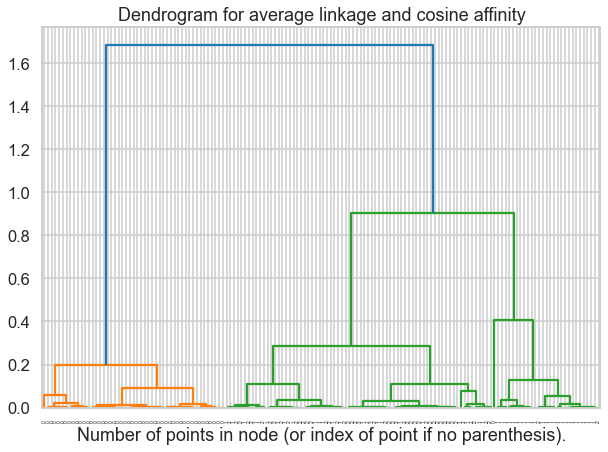

Silhouette score: 0.4941504670863973
Number of clusters: 1


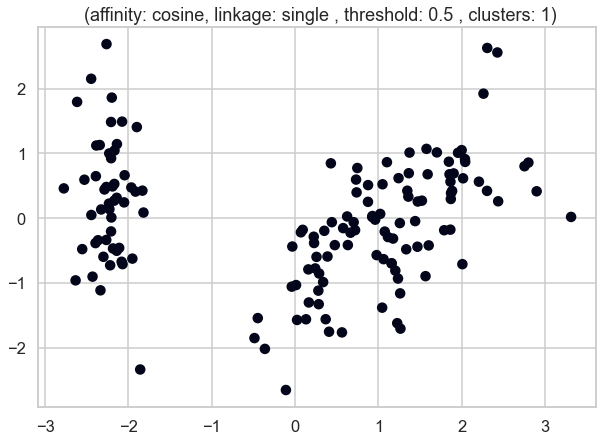

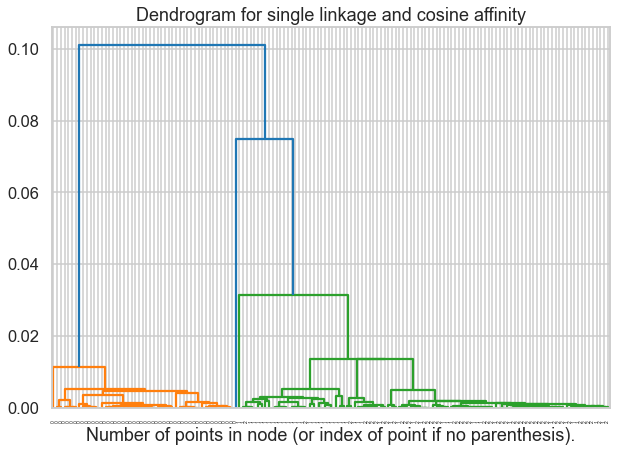

Silhouette score: 0.4941504670863973
Number of clusters: 1


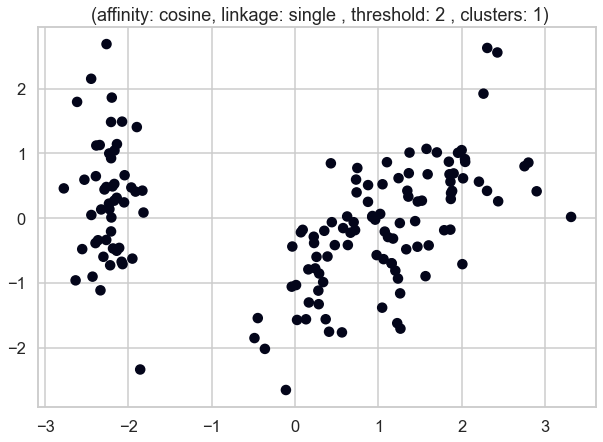

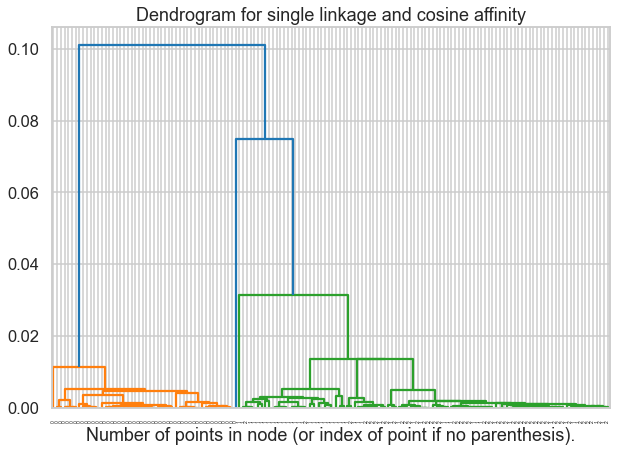

Silhouette score: 0.4941504670863973
Number of clusters: 1


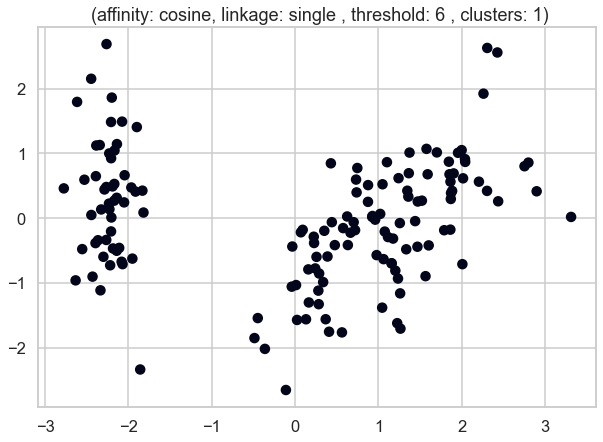

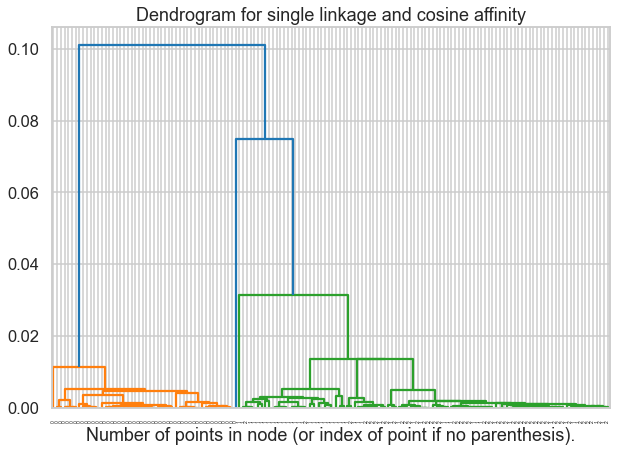

Silhouette score: 0.4941504670863973
Number of clusters: 1
Best Silhouette score: 0.4941504670863973
Number of clusters in best model: 3


In [22]:
# define parameter combinations to try
NumOfClustersi=[]
affinitiesi=['euclidean', 'cosine']
linkagesi=['average', 'single']
thresholdsi=[0.5,2,6]
BestScorei_HC=-1
BestModeli_HC=None

for affinity in affinitiesi:
    for linkage in linkagesi:
        for dist_thresh in thresholdsi:
            HCi = AgglomerativeClustering(n_clusters=None,affinity=affinity,linkage=linkage,distance_threshold=dist_thresh)
            labelsi_HC = HCi.fit_predict(X_pcaI)
            NumOfClustersi.append(HCi.n_clusters_)
            # Display resulting clusters for current parameter combination
            plt.figure(figsize=(10, 7))
            plt.scatter(X_pcaI[:, 0], X_pcaI[:, 1], c=labelsi_HC)
            plt.title(f" (affinity: {affinity}, linkage: {linkage} , threshold: {dist_thresh} , clusters: {HCi.n_clusters_})")
            plt.show()
            try:
                scorei_HC=silhouette_score(X_pcaI, labelsi_HC)
            except ValueError:
                pass
            
            # Keep track of best score and best parameters
            if scorei_HC > BestScorei_HC:
                BestScorei_HC = scorei_HC
                BestModeli_HC = HCi
            
            # Display dendrogram for current parameter combination
            plt.figure(figsize=(10, 7))
            plt.title("Dendrogram for {} linkage and {} affinity".format(linkage, affinity))
            distancesi = pdist(X_pcaI, metric=affinity)
            Zi = hierarchy.linkage(distancesi, method=linkage)
            dendrogrami = hierarchy.dendrogram(Zi, labels=iris_data.target)    #not normalized????
            plt.xlabel("Number of points in node (or index of point if no parenthesis).")
            plt.show()
            print(f"Silhouette score: {scorei_HC}")
            print(f"Number of clusters: {len(set(HCi.labels_))}")
        
                
                
            
print(f"Best Silhouette score: {BestScorei_HC}")
print(f"Number of clusters in best model: {len(set(BestModeli_HC.labels_))}")



# DBscan

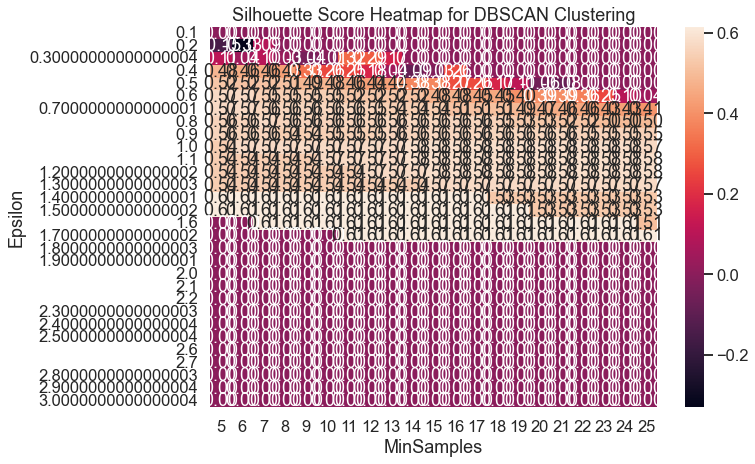

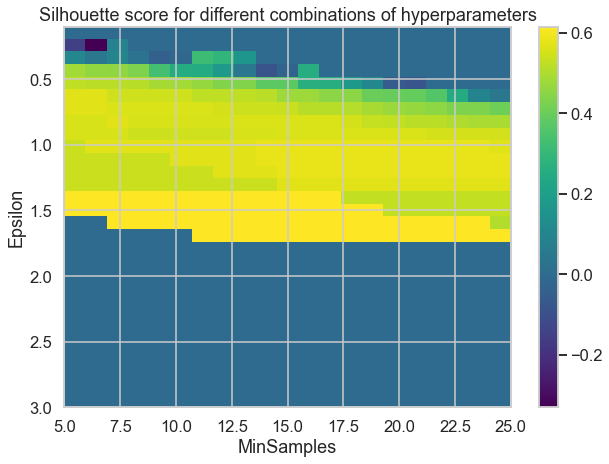

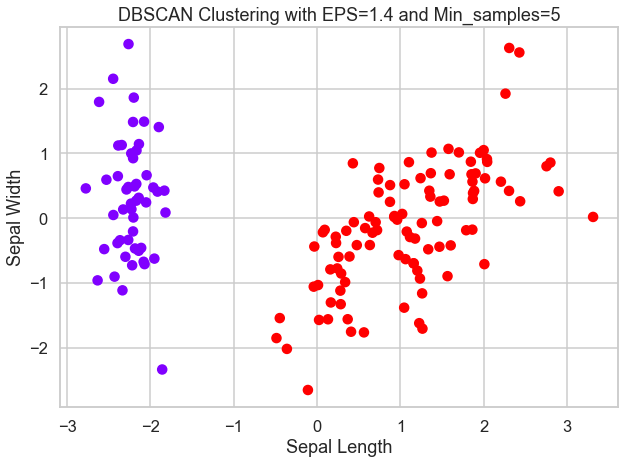

Best Silhouette Score: 0.61


In [23]:
# Define range of hyperparameters to test
Epsiloni=np.arange(0.1, 3.1, 0.1)
MinSamplesi=range(5, 26)
# Loop over hyperparameters and compute silhouette scores
scoresi_DBS = np.zeros((len(Epsiloni), len(MinSamplesi)))
for i, eps in enumerate(Epsiloni):
    for j, min_samples in enumerate(MinSamplesi):
        DBSi = DBSCAN(eps=eps, min_samples=min_samples)
        labelsi_DBS = DBSi.fit_predict(X_pcaI)
        if len(np.unique(labelsi_DBS)) == 1:
            continue
        # Compute silhouette score
        if len(set(DBSi.labels_)) > 1:
            scorei_DBS = silhouette_score(X_pcaI, DBSi.labels_)
        else:
            scorei_DBS = -1
        
        # Store result
        scoresi_DBS[i, j] = scorei_DBS

# Plot heatmap of silhouette scores versus hyperparameters
plt.figure(figsize=(10, 7))
sns.heatmap(scoresi_DBS, xticklabels=MinSamplesi, yticklabels=Epsiloni, annot=True, fmt='.2f')
plt.xlabel('MinSamples')
plt.ylabel('Epsilon')
plt.title('Silhouette Score Heatmap for DBSCAN Clustering')
plt.show()


# Create a 2D plot of the silhouette scores
fig, ax = plt.subplots(figsize=(10, 7))
im = ax.imshow(scoresi_DBS, cmap='viridis', aspect='auto',extent=[MinSamplesi[0], MinSamplesi[-1], Epsiloni[-1], Epsiloni[0]])
ax.set_xlabel('MinSamples')
ax.set_ylabel('Epsilon')
ax.set_title('Silhouette score for different combinations of hyperparameters')
plt.colorbar(im)
plt.show()

# Find the hyperparameters that give the best silhouette score
BestEpsilonIndexi, BestMinSamplesIndexi = np.unravel_index(np.argmax(scoresi_DBS), scoresi_DBS.shape)
BestEpsiloni = Epsiloni[BestEpsilonIndexi]
BestMinSamplesi = MinSamplesi[BestMinSamplesIndexi]
BestScorei_DBS = scoresi_DBS[BestEpsilonIndexi, BestMinSamplesIndexi]
# Run DBSCAN with best hyperparameters
BestLabelsi_DBS = DBSCAN(eps=BestEpsiloni, min_samples=BestMinSamplesi).fit_predict(X_pcaI)



# Plot resulting clusters
plt.figure(figsize=(10, 7))
plt.scatter(X_pcaI[:, 0], X_pcaI[:, 1], c=BestLabelsi_DBS, cmap='rainbow')
plt.xlabel('Sepal Length')
plt.ylabel('Sepal Width')
plt.title('DBSCAN Clustering with EPS={:.1f} and Min_samples={}'.format(BestEpsiloni, BestMinSamplesi))
plt.show()

# Print best silhouette score
print('Best Silhouette Score: {:.2f}'.format(BestScorei_DBS))

# GaussianMixture

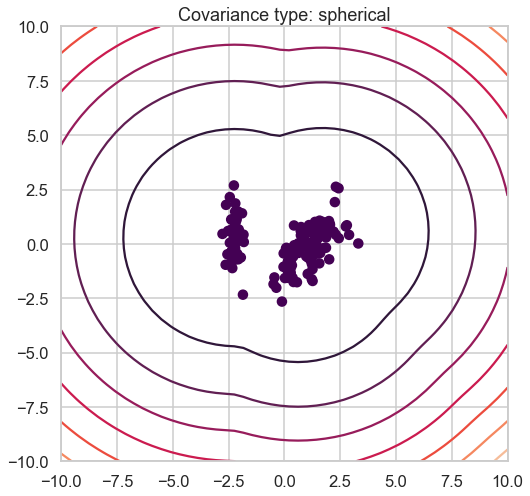

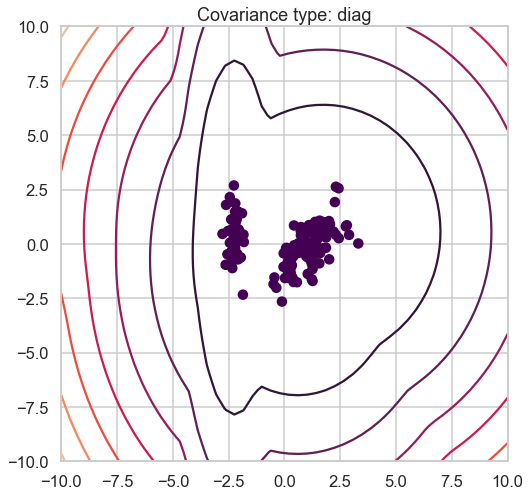

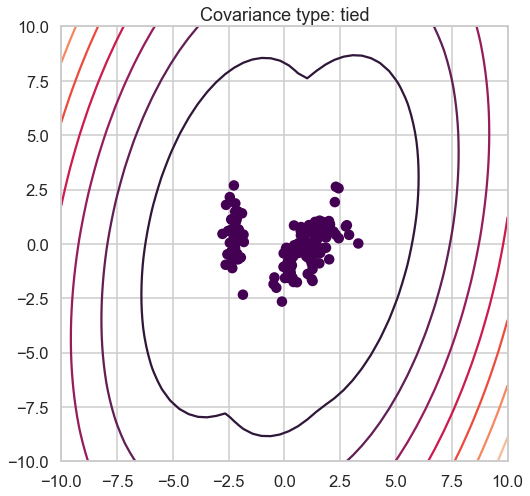

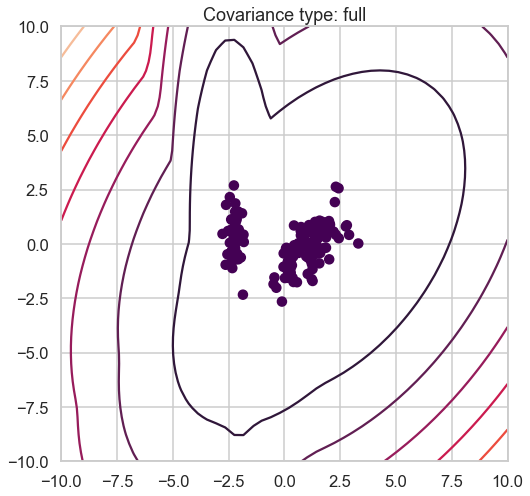

In [24]:
CovarianceTypesi = ['spherical', 'diag', 'tied','full']
for cov_type in CovarianceTypesi:
    gmmi = GaussianMixture(n_components=3, covariance_type=cov_type, random_state=42)
    gmmi.fit(X_pcaI)
    labelsi_gmm = gmmi.predict(X_pcaI)

    # Visualize the results
    xi = np.linspace(-10, 10)
    yi = np.linspace(-10, 10)
    Xi, Yi = np.meshgrid(x, y)
    XXi = np.array([Xi.ravel(), Yi.ravel()]).T
    Zi = -gmmi.score_samples(XXi)
    Zi = Zi.reshape(Xi.shape)

    plt.contour(Xi, Yi, Zi)
    plt.scatter(X_pcaI[:, 0], X_pcaI[:, 1], c=labelsi_DBS, cmap='viridis')
    plt.title(f"Covariance type: {cov_type}")
    plt.show()


## Customer dataset
Repeat all the above on the customer data set 

In [25]:
#Reading the csv file of the customer dataset
data = pd.read_csv('Customer data.csv')

# Normalization and PCA 

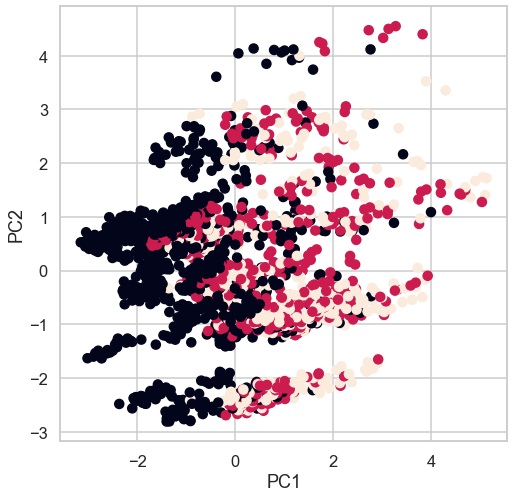

In [26]:
#converting the dataset to dataframe to apply normalization and PCA on it
Customer_dataframe=pd.DataFrame(data)
# Separate features from target
X_customer = Customer_dataframe.iloc[:, :-1]
y_customer = Customer_dataframe.iloc[:, -1]

# Standardize the data and normalizing data
Customer_scalar = StandardScaler()
Xc_std = Customer_scalar.fit_transform(X_customer)

# Instantiate PCA object with desired number of components
Customer_pca = PCA(n_components=2)

# Fit and transform the data
Xc_pca = Customer_pca.fit_transform(Xc_std)

# Plot the transformed data
import matplotlib.pyplot as plt
plt.scatter(Xc_pca[:, 0], Xc_pca[:, 1], c=y_customer)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()



In [27]:
Xc_pca

array([[ 2.67820466,  0.79519386],
       [ 0.07111806,  0.47172845],
       [ 0.58445897, -0.9737603 ],
       ...,
       [-1.57338448, -2.11663584],
       [-2.58241265,  0.69116226],
       [-2.02066246, -2.35224252]])

In [28]:
Xc_std

array([[-1.731185  , -0.91739884, -0.99302433, ...,  1.60432297,
         0.09752361,  0.29682303],
       [-1.72945295,  1.09003844,  1.00702467, ..., -0.06337243,
         0.78265438,  0.29682303],
       [-1.7277209 , -0.91739884, -0.99302433, ..., -0.06337243,
        -0.83320224, -1.26952539],
       ...,
       [ 1.7277209 , -0.91739884, -0.99302433, ..., -1.73106782,
        -0.90695688, -1.26952539],
       [ 1.72945295,  1.09003844,  1.00702467, ..., -0.06337243,
        -0.60332923, -1.26952539],
       [ 1.731185  , -0.91739884, -0.99302433, ..., -1.73106782,
        -1.3789866 , -1.26952539]])

# Kmeans clustering

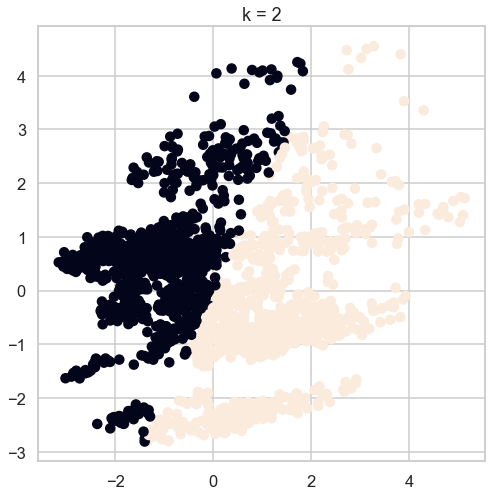

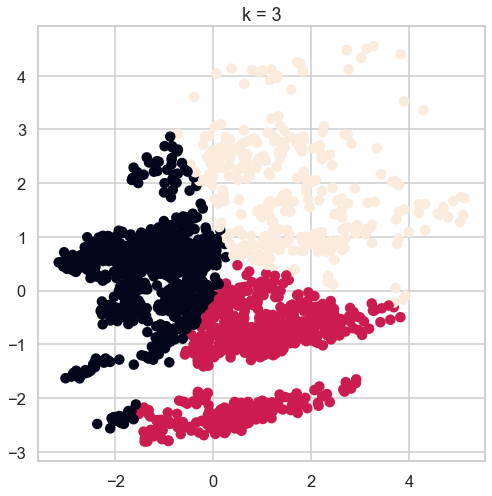

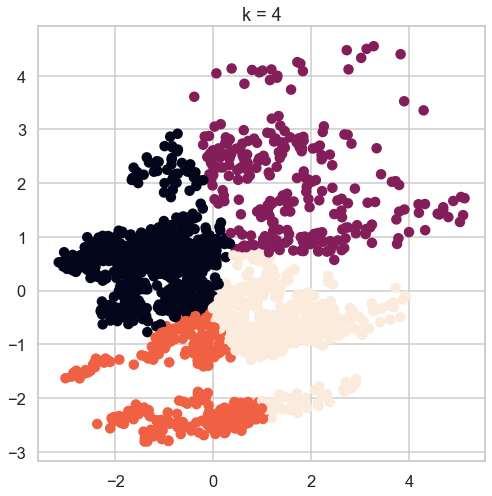

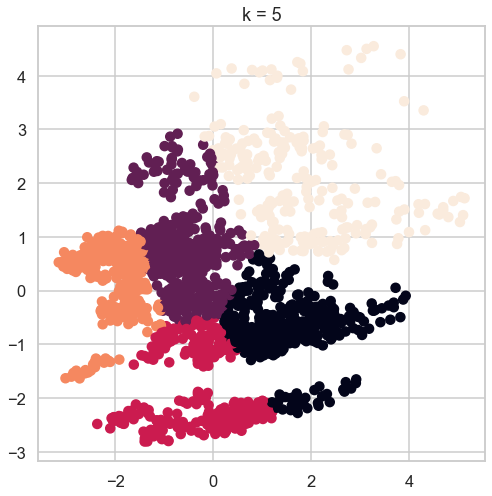

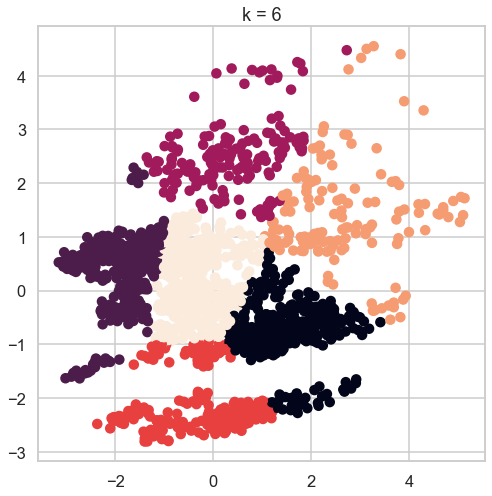

In [29]:
# Define list of values of k to try
Customer_Kvalues=range(2,7)
Customer_distortions=[]
Customer_silhouettes=[]
# Apply k-means clustering for each value of k and plot results
for K in Customer_Kvalues:
    # Create k-means model with k clusters
    Customer_kmeans = KMeans(n_clusters=K, random_state=42)
    # Fit model to data
    Customer_kmeans.fit(Xc_pca)
    # Get predicted cluster labels for data
    y_kmeans_pred = Customer_kmeans.predict(Xc_pca)
    Customer_distortions.append(Customer_kmeans.inertia_)
    if K > 1:
        Customer_silhouettes.append(silhouette_score(Xc_pca, y_kmeans_pred))
    # Plot results
    plt.scatter(Xc_pca[:, 0], Xc_pca[:, 1], c=y_kmeans_pred)
    plt.title('k = {}'.format(K))
    plt.show()

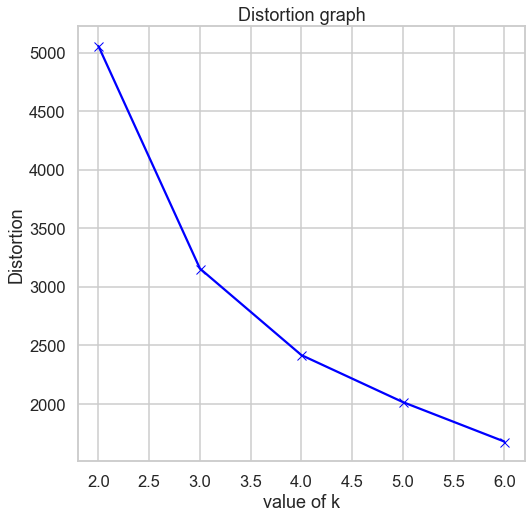

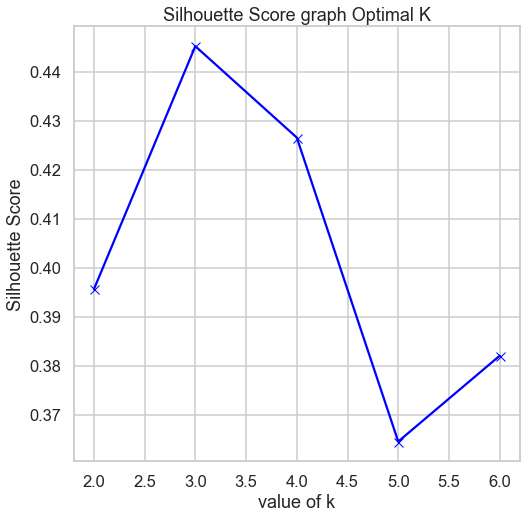

The best K value based on Silhouette Score is: 3


In [30]:
# Plot distortion function vs. K
plt.plot(Customer_Kvalues, Customer_distortions, 'bx-')
plt.xlabel('value of k')
plt.ylabel('Distortion')
plt.title('Distortion graph')
plt.show()

# Plot silhouette score versus K
plt.plot(Customer_Kvalues,Customer_silhouettes, 'bx-')
plt.xlabel('value of k')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score graph Optimal K')
plt.show()

# Find the best K value based on the highest silhouette score
Customer_Bestk = np.argmax(Customer_silhouettes) + 2  # Add 2 to account for range of K values starting from 2
print("The best K value based on Silhouette Score is:", Customer_Bestk)

# Hierarichal clustering

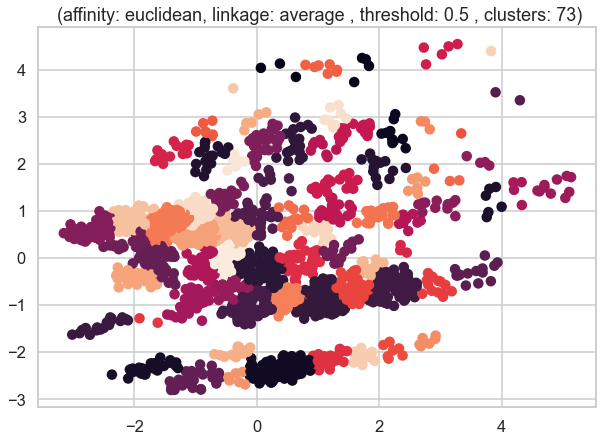

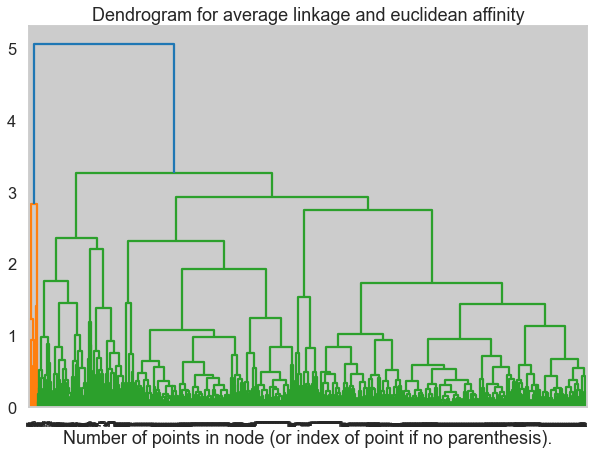

Silhouette score: 0.37125830294792583
Number of clusters: 73


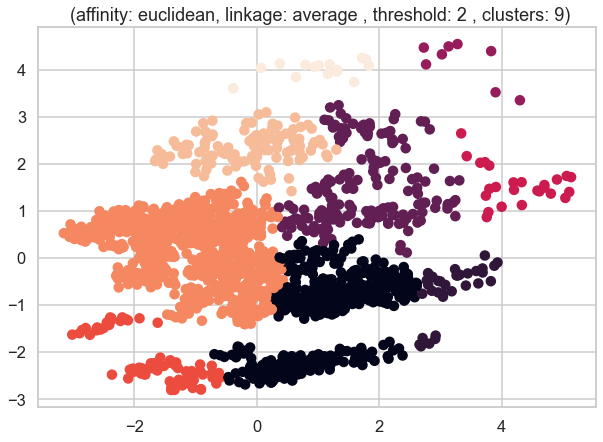

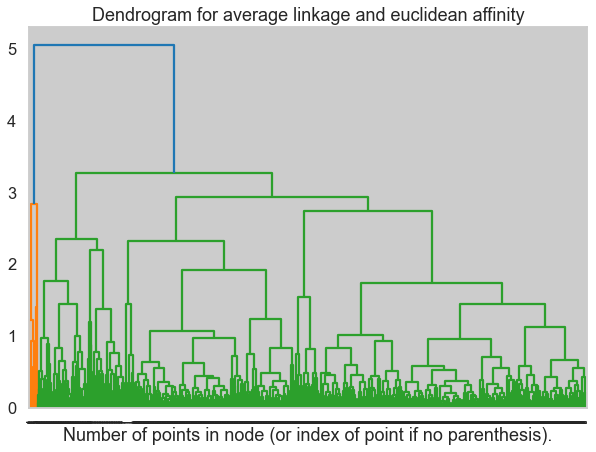

Silhouette score: 0.3363003229372915
Number of clusters: 9


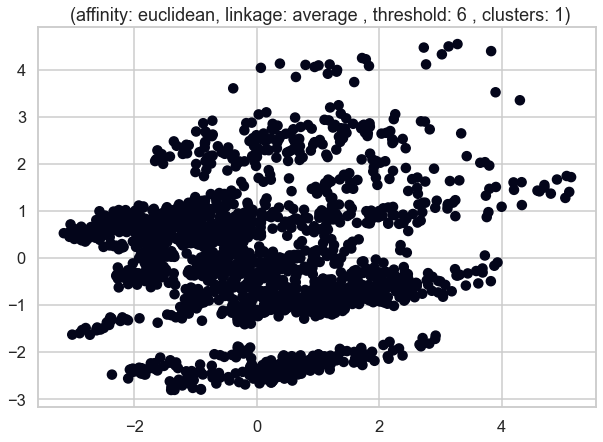

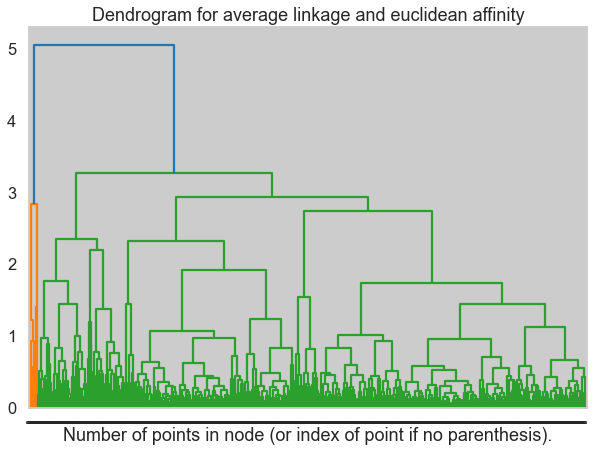

Silhouette score: 0.3363003229372915
Number of clusters: 1


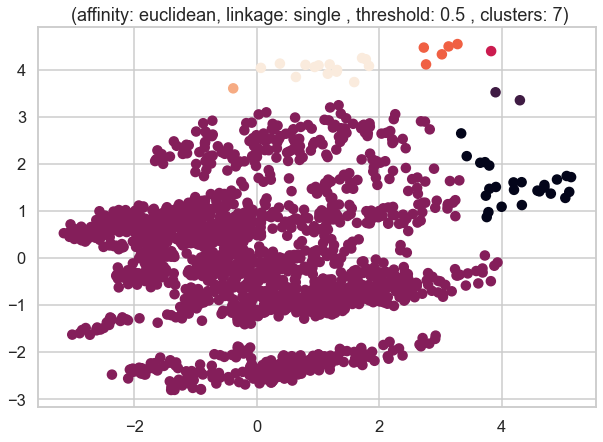

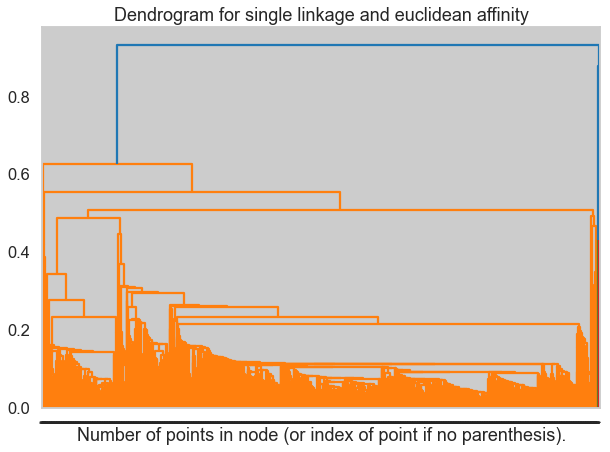

Silhouette score: 0.28055772481437535
Number of clusters: 7


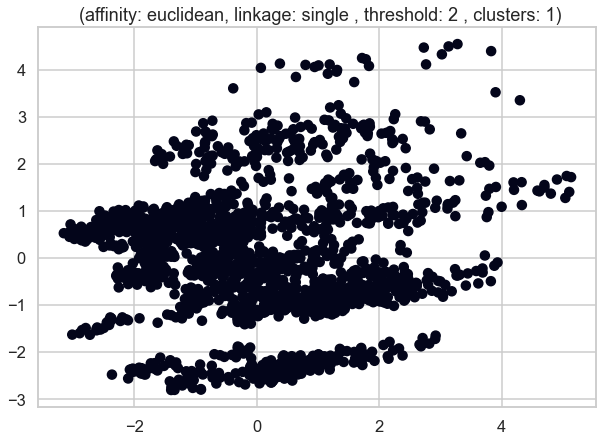

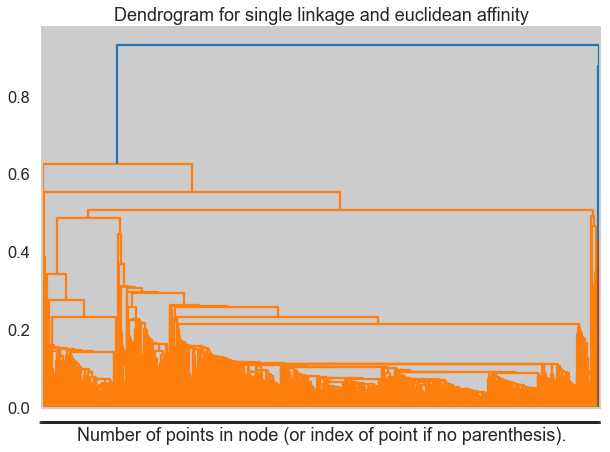

Silhouette score: 0.28055772481437535
Number of clusters: 1


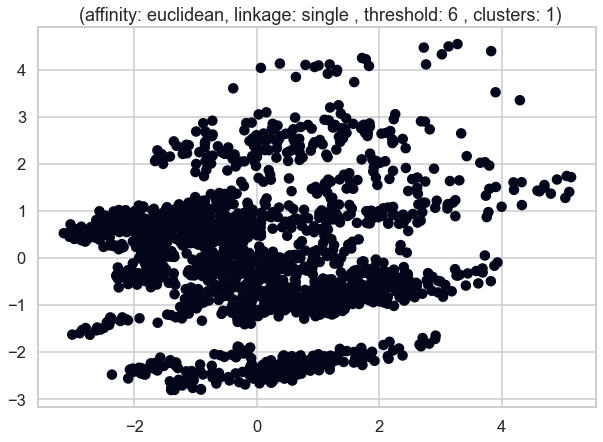

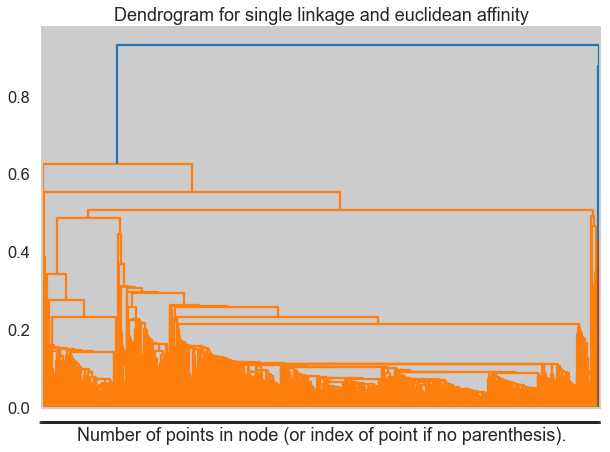

Silhouette score: 0.28055772481437535
Number of clusters: 1


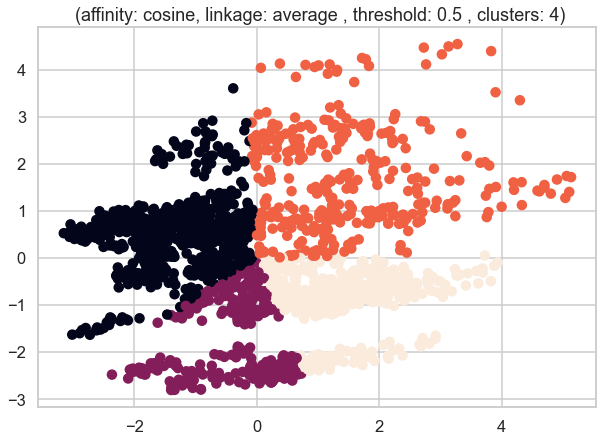

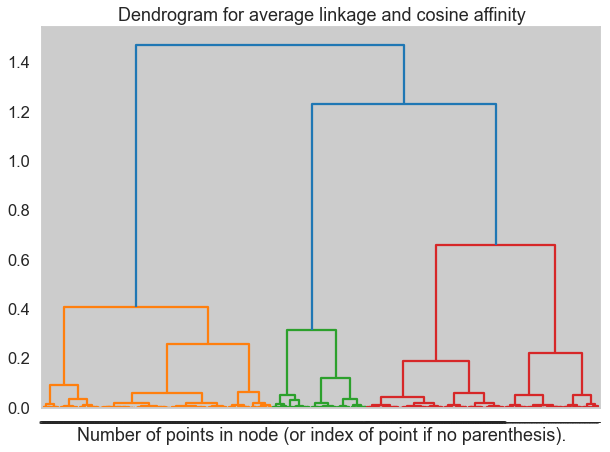

Silhouette score: 0.39497565145354624
Number of clusters: 4


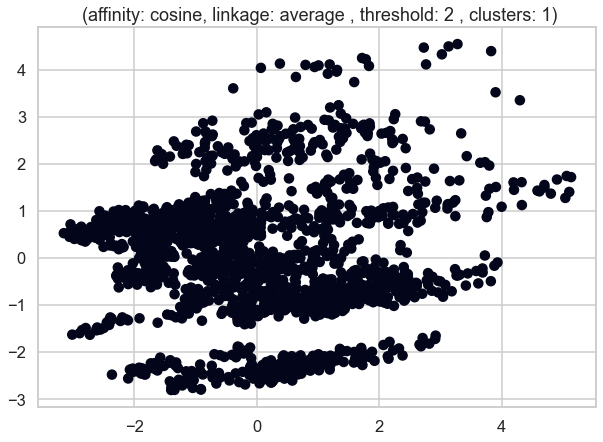

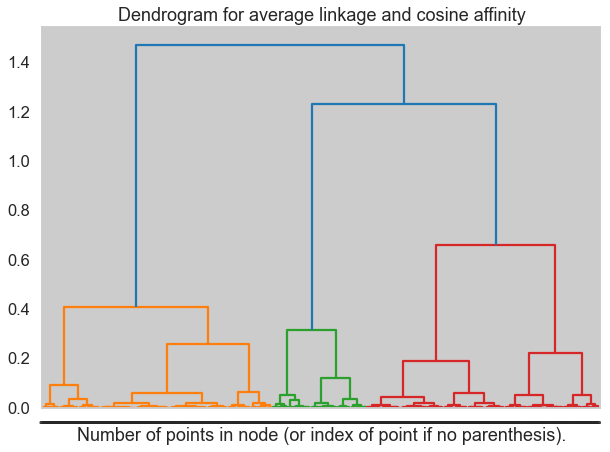

Silhouette score: 0.39497565145354624
Number of clusters: 1


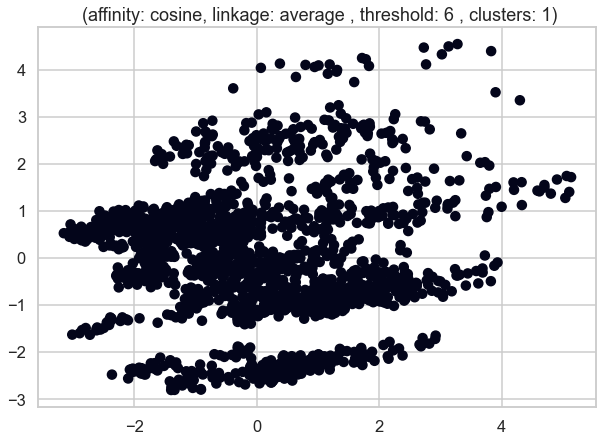

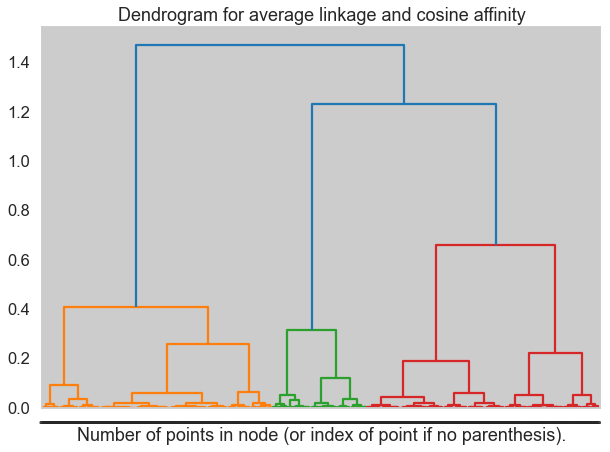

Silhouette score: 0.39497565145354624
Number of clusters: 1


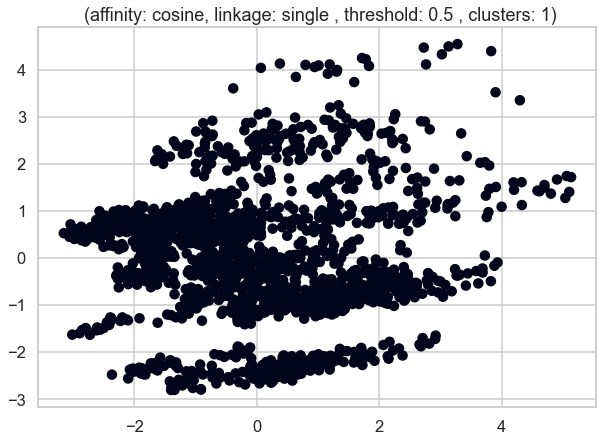

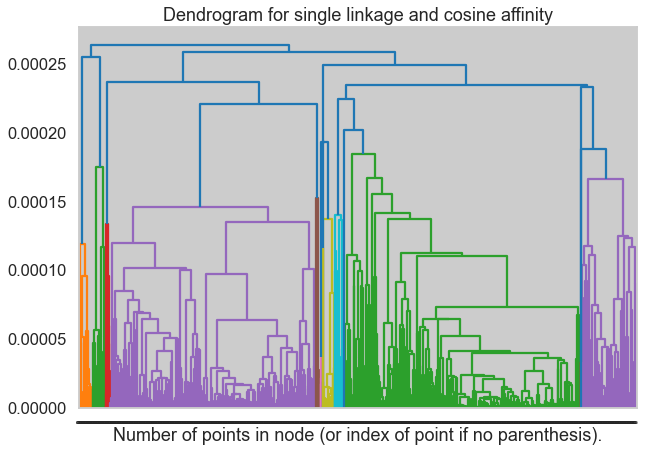

Silhouette score: 0.39497565145354624
Number of clusters: 1


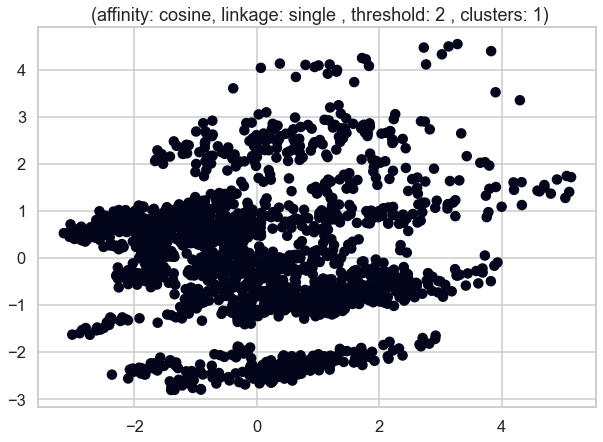

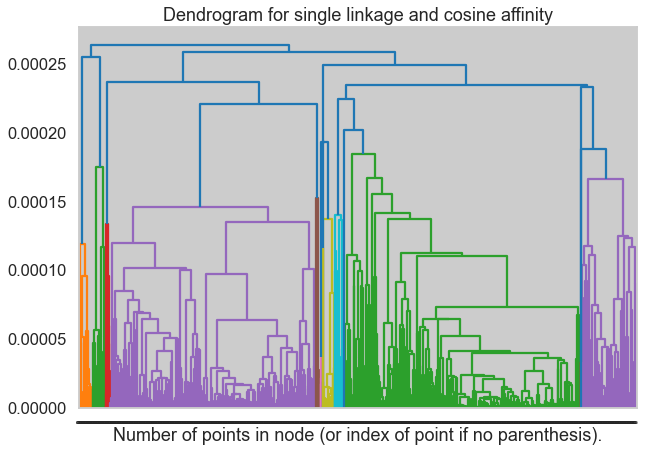

Silhouette score: 0.39497565145354624
Number of clusters: 1


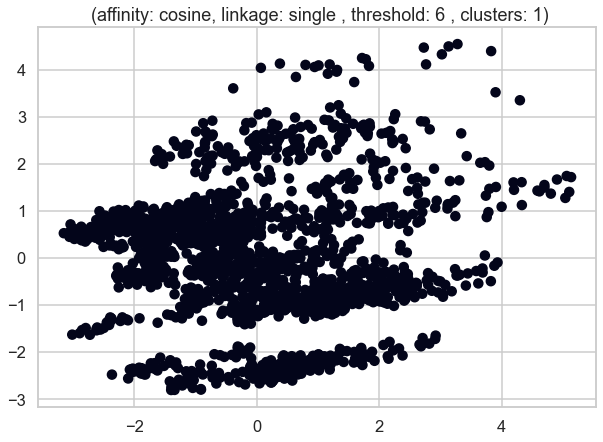

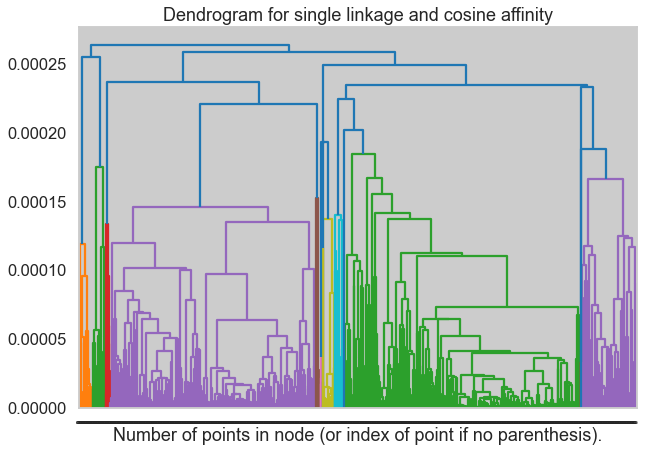

Silhouette score: 0.39497565145354624
Number of clusters: 1
Best Silhouette score: 0.39497565145354624
Number of clusters in best model: 4


In [31]:
# define parameter combinations to try
Customer_HC_NumOfClusters=[]
Customer_affinities=['euclidean', 'cosine']
Customer_linkages=['average', 'single']
Customer_thresholds=[0.5,2,6]
Customer_HC_BestScore=-1
Customer_HC_BestModel=None

#Applying AgglomerativeClustering with different combination of parameters
for affinity in Customer_affinities:
    for linkage in Customer_linkages:
        for dist_thresh in Customer_thresholds:
            Customer_HC = AgglomerativeClustering(n_clusters=None,affinity=affinity,linkage=linkage,distance_threshold=dist_thresh)
            Customer_HC_labels = Customer_HC.fit_predict(Xc_pca)
            Customer_HC_NumOfClusters.append(Customer_HC.n_clusters_)
            # Display resulting clusters for current parameter combination
            plt.figure(figsize=(10, 7))
            plt.scatter(Xc_pca[:, 0], Xc_pca[:, 1], c=Customer_HC_labels)
            plt.title(f" (affinity: {affinity}, linkage: {linkage} , threshold: {dist_thresh} , clusters: {Customer_HC.n_clusters_})")
            plt.show()
            try:
                Customer_HC_score=silhouette_score(Xc_pca, Customer_HC_labels)
            except ValueError:
                pass
            
            # Keep track of best score and best parameters
            if Customer_HC_score > Customer_HC_BestScore:
                Customer_HC_BestScore = Customer_HC_score
                Customer_HC_BestModel = Customer_HC
            
            # Display dendrogram for current parameter combination
            plt.figure(figsize=(10, 7))
            plt.title("Dendrogram for {} linkage and {} affinity".format(linkage, affinity))
            Customer_distances = pdist(Xc_pca, metric=affinity)
            Zc = hierarchy.linkage(Customer_distances, method=linkage)
            Customer_dendrogram = hierarchy.dendrogram(Zc, labels=Customer_HC_labels) 
            plt.xlabel("Number of points in node (or index of point if no parenthesis).")
            plt.show()
            print(f"Silhouette score: {Customer_HC_score}")
            print(f"Number of clusters: {len(set(Customer_HC.labels_))}")
        
                
                
#Getting the best Silhouette score, best model and number of clusters in it             
print(f"Best Silhouette score: {Customer_HC_BestScore}")
print(f"Number of clusters in best model: {len(set(Customer_HC_BestModel.labels_))}")


# DBscan 

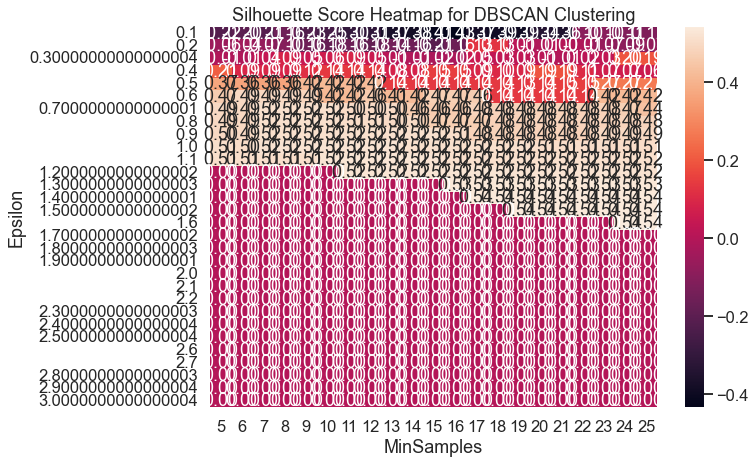

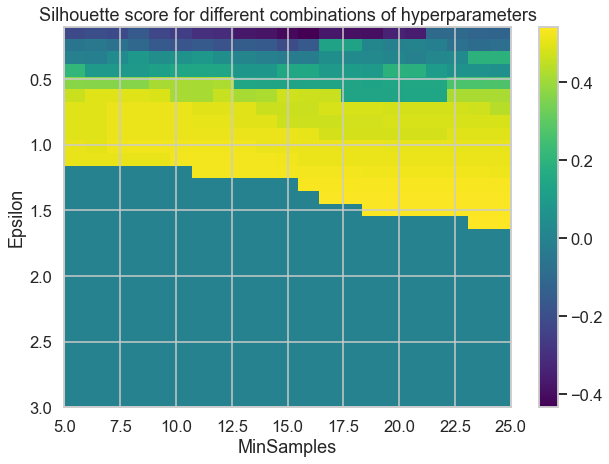

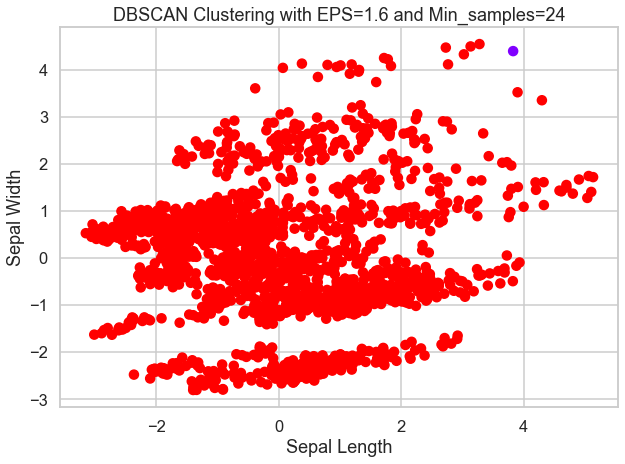

Best Silhouette Score: 0.54


In [32]:
# Define range of hyperparameters to test
Customer_Epsilon=np.arange(0.1, 3.1, 0.1)
Customer_MinSamples=range(5, 26)
# Loop over hyperparameters and compute silhouette scores
Customer_DBS_scores = np.zeros((len(Customer_Epsilon), len(Customer_MinSamples)))
for i, eps in enumerate(Customer_Epsilon):
    for j, min_samples in enumerate(Customer_MinSamples):
        Customer_DBS = DBSCAN(eps=eps, min_samples=min_samples)
        Customer_DBS_labels = Customer_DBS.fit_predict(Xc_pca)
        if len(np.unique(Customer_DBS_labels)) == 1:
            continue
        # Compute silhouette score
        if len(set(Customer_DBS.labels_)) > 1:
            Customer_DBS_score = silhouette_score(Xc_pca, Customer_DBS.labels_)
        else:
            Customer_DBS_score = -1
        
        # Store result
        Customer_DBS_scores[i, j] = Customer_DBS_score

# Plot heatmap of silhouette scores versus hyperparameters
plt.figure(figsize=(10, 7))
sns.heatmap(Customer_DBS_scores, xticklabels=Customer_MinSamples, yticklabels=Customer_Epsilon, annot=True, fmt='.2f')
plt.xlabel('MinSamples')
plt.ylabel('Epsilon')
plt.title('Silhouette Score Heatmap for DBSCAN Clustering')
plt.show()


# Create a 2D plot of the silhouette scores
fig, ax = plt.subplots(figsize=(10, 7))
im = ax.imshow(Customer_DBS_scores, cmap='viridis', aspect='auto',extent=[Customer_MinSamples[0], Customer_MinSamples[-1], Customer_Epsilon[-1], Customer_Epsilon[0]])
ax.set_xlabel('MinSamples')
ax.set_ylabel('Epsilon')
ax.set_title('Silhouette score for different combinations of hyperparameters')
plt.colorbar(im)
plt.show()

# Find the hyperparameters that give the best silhouette score
Customer_BestEpsilonIndex, Customer_BestMinSamplesIndex = np.unravel_index(np.argmax(Customer_DBS_scores), Customer_DBS_scores.shape)
Customer_BestEpsilon = Customer_Epsilon[Customer_BestEpsilonIndex]
Customer_BestMinSamples = Customer_MinSamples[Customer_BestMinSamplesIndex]
Customer_DBS_BestScore = Customer_DBS_scores[Customer_BestEpsilonIndex, Customer_BestMinSamplesIndex]
# Run DBSCAN with best hyperparameters
Customer_DBS_BestLabels = DBSCAN(eps=Customer_BestEpsilon, min_samples=Customer_BestMinSamples).fit_predict(Xc_pca)



# Plot resulting clusters
plt.figure(figsize=(10, 7))
plt.scatter(Xc_pca[:, 0], Xc_pca[:, 1], c=Customer_DBS_BestLabels, cmap='rainbow')
plt.xlabel('Sepal Length')
plt.ylabel('Sepal Width')
plt.title('DBSCAN Clustering with EPS={:.1f} and Min_samples={}'.format(Customer_BestEpsilon, Customer_BestMinSamples))
plt.show()

# Print best silhouette score
print('Best Silhouette Score: {:.2f}'.format(Customer_DBS_BestScore))

# GaussianMixture

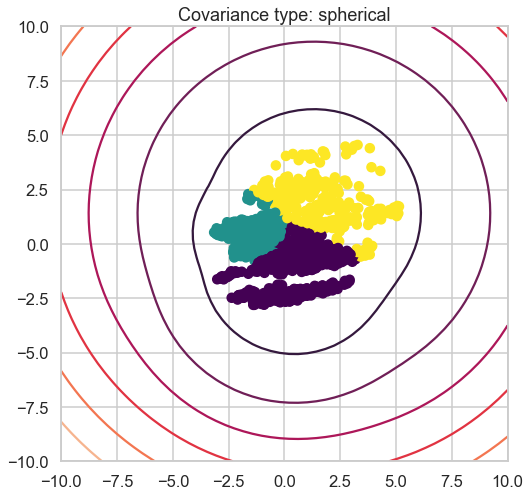

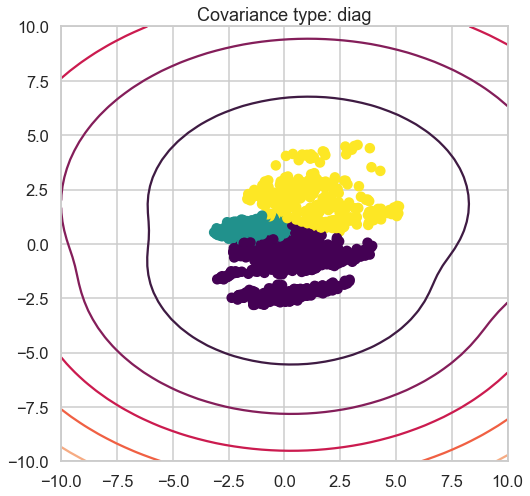

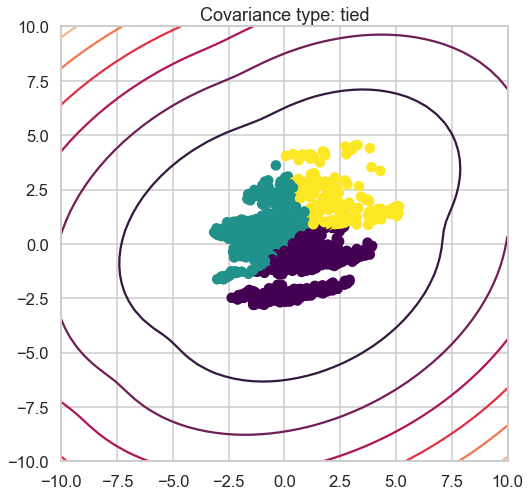

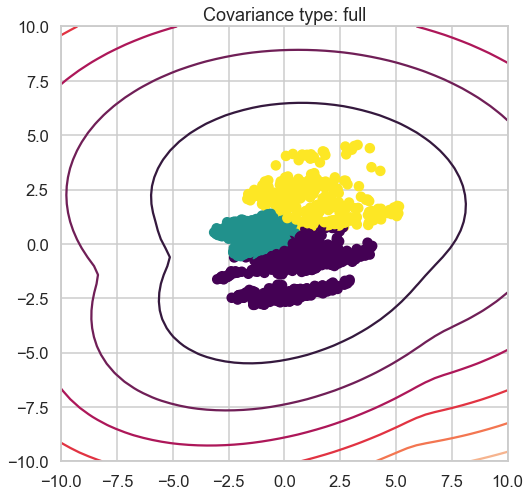

In [33]:
Customer_CovarianceTypes = ['spherical', 'diag', 'tied','full']
for cov_type in Customer_CovarianceTypes:
    Customer_gmm = GaussianMixture(n_components=3, covariance_type=cov_type, random_state=42)
    Customer_gmm.fit(Xc_pca)
    Customer_gmm_labels = Customer_gmm.predict(Xc_pca)

    # Visualize the results
    xc = np.linspace(-10, 10)
    yc = np.linspace(-10, 10)
    Xc, Yc = np.meshgrid(xc, yc)
    XXc = np.array([Xc.ravel(), Yc.ravel()]).T
    Zc = -Customer_gmm.score_samples(XXc)
    Zc = Zc.reshape(Xc.shape)

    plt.contour(Xc, Yc, Zc)
    plt.scatter(Xc_pca[:, 0], Xc_pca[:, 1], c=Customer_gmm_labels, cmap='viridis')
    plt.title(f"Covariance type: {cov_type}")
    plt.show()
